<a href="https://colab.research.google.com/github/noviardhana/data_wizards/blob/master/flight.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#UNSUPERVISED LEARNING Homework

Data Wizards

## Import Library

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

from sklearn.decomposition import PCA

sns.set_style('whitegrid')

## Import Dataset

In [ ]:
!gdown --id 14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U # Download File

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U
To: /content/flight.csv
100% 8.94M/8.94M [00:00<00:00, 26.8MB/s]


In [ ]:
data = pd.read_csv('flight.csv')
df = data.copy()

In [ ]:
df.sample(10)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,...,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
42966,56516,5/25/2007,5/25/2007,Male,4,zhengzhou,henan,CN,72.0,3/31/2014,...,2548.0,4438,12/21/2013,102,63.400000,186,0,0.903709,4069,0
52263,21807,3/9/2012,2/21/2014,Male,4,shanghai,shanghai,CN,28.0,3/31/2014,...,2288.0,5072,3/17/2014,15,12.500000,21,0,0.476457,582,0
39775,24280,2/6/2012,2/6/2012,Female,4,shanghai,shanghai,CN,45.0,3/31/2014,...,0.0,5797,5/22/2013,315,66.000000,134,0,0.810574,3826,0
26524,57401,6/30/2008,6/30/2008,Female,4,guangzhou,guangdong,CN,32.0,3/31/2014,...,3075.0,15542,3/6/2014,26,56.181818,223,1,0.569895,11124,9
40582,29407,5/22/2007,5/22/2007,Male,4,guangzhou,guangdong,CN,40.0,3/31/2014,...,0.0,6120,9/27/2012,552,86.000000,142,0,0.738783,2739,0
13143,7777,5/21/2011,7/18/2011,Male,4,kunshan,jiangsu,CN,39.0,3/31/2014,...,5281.0,23108,3/9/2014,23,31.047619,90,0,0.769439,16592,0
22331,25513,1/1/2013,1/28/2013,Female,4,wulumuqi,xinjiang,CN,30.0,3/31/2014,...,4524.0,17890,3/2/2014,30,99.750000,280,0,0.609269,8324,0
3099,31382,2/4/2010,2/4/2010,Male,5,guangzhou,guangdong,CN,39.0,3/31/2014,...,24388.0,52275,3/28/2014,4,14.979167,91,0,0.824703,49911,29
32088,42421,5/2/2012,8/2/2012,Male,4,wuhan,hubei,CN,38.0,3/31/2014,...,5400.0,9029,3/7/2014,25,72.875000,381,0,0.751030,5561,0
3556,26003,1/31/2012,1/31/2012,Male,4,guangzhou,guangdong,CN,33.0,3/31/2014,...,2500.0,53714,3/12/2014,20,27.880000,222,3,0.755155,28507,3


# Feature Desc

| No | Column            | Description                                                          |
|----|-------------------|----------------------------------------------------------------------|
| 1  | MEMBER_NO         | ID Member                                                            |
| 2  | FFP_DATE          | Frequent Flyer Program Join Date                                     |
| 3  | FIRST_FLIGHT_DATE | Tanggal Penerbangan pertama                                          |
| 4  | GENDER            | Jenis Kelamin                                                        |
| 5  | FFP_TIER          | Tier dari Frequent Flyer Program                                     |
| 6  | WORK_CITY         | Kota Asal                                                            |
| 7  | WORK_PROVINCE     | Provinsi Asal                                                        |
| 8  | WORK_COUNTRY      | Negara Asal                                                          |
| 9  | AGE               | Umur Customer                                                        |
| 10 | LOAD_TIME         | Tanggal data diambil                                                 |
| 11 | FLIGHT_COUNT      | Jumlah penerbangan Customer                                          |
| 12 | BP_SUM            | Rencana Perjalanan                                                   |
| 13 | SUM_YR_1          | Fare Revenue                                                         |
| 14 | SUM_YR_2          | Votes Prices                                                         |
| 15 | SEG_KM_SUM        | Total jarak(km) penerbangan yg sudah dilakukan                       |
| 16 | LAST_FLIGHT_DATE  | Tanggal penerbangan terakhir                                         |
| 17 | LAST_TO_END       | Jarak waktu penerbangan terakhir ke pesanan penerbangan paling akhir |
| 18 | AVG_INTERVAL      | Rata-rata jarak waktu                                                |
| 19 | MAX_INTERVAL      | Maksimal jarak waktu                                                 |
| 20 | EXCHANGE_COUNT    | Jumlah penukaran                                                     |
| 21 | avg_discount      | Rata rata discount yang didapat customer                             |
| 22 | Points_Sum        | Jumlah poin yang didapat customer                                    |
| 23 | Point_NotFlight   | point yang tidak digunakan oleh members                              |

Insight yang dapat diambil dari dataset ini adalah:
- Data ini berkaitan dengan program frequent flyer yang digunakan oleh suatu maskapai penerbangan. Dalam program ini, pelanggan akan mendapatkan poin setiap kali melakukan penerbangan dengan maskapai tersebut, dan poin tersebut dapat ditukar dengan berbagai keuntungan seperti diskon, upgrade kelas penerbangan, dan lain sebagainya.
- Dataset ini terdiri dari 23 kolom yang berisi informasi mengenai identitas dan aktivitas pelanggan dalam program frequent flyer tersebut.
- Kolom-kolom tersebut dapat dibagi menjadi beberapa kategori, yaitu:
    - Kolom identitas: MEMBER_NO, GENDER, AGE, WORK_CITY, WORK_PROVINCE, WORK_COUNTRY.
    - Kolom aktivitas penerbangan: FFP_DATE, FIRST_FLIGHT_DATE, FFP_TIER, FLIGHT_COUNT, BP_SUM, SUM_YR_1, SUM_YR_2, SEG_KM_SUM, LAST_FLIGHT_DATE, LAST_TO_END, AVG_INTERVAL, MAX_INTERVAL.
    - Kolom keuntungan: EXCHANGE_COUNT, avg_discount, Points_Sum, Point_NotFlight.
- Dalam kolom aktivitas penerbangan, SUM_YR_1 dan SUM_YR_2 berkaitan dengan pendapatan yang diperoleh dari penerbangan, sedangkan SEG_KM_SUM merupakan total jarak yang telah diterbangi oleh pelanggan. Kolom-kolom ini dapat memberikan informasi mengenai seberapa sering pelanggan melakukan penerbangan dan seberapa besar pengaruhnya terhadap pendapatan maskapai.
- Kolom keuntungan seperti avg_discount, Points_Sum, dan Point_NotFlight dapat memberikan informasi mengenai seberapa besar keuntungan yang diperoleh oleh pelanggan dari program frequent flyer tersebut. Kolom Points_Sum dan Point_NotFlight berkaitan dengan jumlah poin yang didapatkan oleh pelanggan dan cara pemanfaatannya, sedangkan kolom avg_discount berkaitan dengan diskon yang diberikan kepada pelanggan.

## EDA

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MEMBER_NO          62988 non-null  int64  
 1   FFP_DATE           62988 non-null  object 
 2   FIRST_FLIGHT_DATE  62988 non-null  object 
 3   GENDER             62985 non-null  object 
 4   FFP_TIER           62988 non-null  int64  
 5   WORK_CITY          60719 non-null  object 
 6   WORK_PROVINCE      59740 non-null  object 
 7   WORK_COUNTRY       62962 non-null  object 
 8   AGE                62568 non-null  float64
 9   LOAD_TIME          62988 non-null  object 
 10  FLIGHT_COUNT       62988 non-null  int64  
 11  BP_SUM             62988 non-null  int64  
 12  SUM_YR_1           62437 non-null  float64
 13  SUM_YR_2           62850 non-null  float64
 14  SEG_KM_SUM         62988 non-null  int64  
 15  LAST_FLIGHT_DATE   62988 non-null  object 
 16  LAST_TO_END        629

In [ ]:
c = df.shape[0]
df.shape

(62988, 23)

In [ ]:
null_columns = df.columns[df.isnull().any()]
print(df[null_columns].isnull().sum())

GENDER              3
WORK_CITY        2269
WORK_PROVINCE    3248
WORK_COUNTRY       26
AGE               420
SUM_YR_1          551
SUM_YR_2          138
dtype: int64


In [ ]:
df.duplicated().any()

False

Terdapat beberapa fitur dengan nilai null dan tidak ditemukan nilai yang duplikat. 

In [ ]:
df[null_columns].isnull().sum()/df.shape[0]*100

GENDER           0.004763
WORK_CITY        3.602273
WORK_PROVINCE    5.156538
WORK_COUNTRY     0.041278
AGE              0.666794
SUM_YR_1         0.874770
SUM_YR_2         0.219089
dtype: float64

Persentase data yang hilang paling tinggi berada pada fitur `WORK_PROVINCE` yaitu **5.15%**. Sehingga row yang memiliki nilai null akan didrop

In [ ]:
df.dropna(subset = null_columns, inplace = True)

In [ ]:
df.shape

(58255, 23)

In [ ]:
(1-df.shape[0]/c)*100

7.5141296754937414

Hasil row yang di drop karena null yaitu ***7.15%***

In [ ]:
def parse_date(df):
    date_cols = ['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']
    for col in date_cols:
        try:
            df[col] = pd.to_datetime(df[col])
        except:
            print(f"Error parsing date column: {col}")
    return df[date_cols]

parse_date(df)

# convert the columns to datetime format, with invalid values set to NaT
df['LAST_FLIGHT_DATE'] = pd.to_datetime(df['LAST_FLIGHT_DATE'], errors='coerce')

# identify the rows with invalid values and drop them
df = df.dropna(subset=['LAST_FLIGHT_DATE'])

Error parsing date column: LAST_FLIGHT_DATE


In [ ]:
df['FFP_TIER'].value_counts()

4    53231
5     3202
6     1427
Name: FFP_TIER, dtype: int64

Merubah tipe data menjadi `datetime`

In [ ]:
df.describe(include='number')

,MEMBER_NO,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
count,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000,57860.00000,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000,57860.000000
mean,31543.210854,4.104666,42.233253,12.043000,11047.843726,5363.816955,5679.279658,17324.371863,172.20598,67.963638,167.221673,0.327981,0.720626,12721.368960,2.819703
std,18182.130529,0.378206,9.763364,14.239523,16294.179086,8110.434363,8714.783954,20982.734648,180.80718,77.533059,122.901236,1.149762,0.183942,20621.601695,7.497873
min,3.000000,4.000000,6.000000,2.000000,0.000000,0.000000,0.000000,368.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15794.750000,4.000000,35.000000,3.000000,2599.750000,1020.000000,833.000000,4882.000000,28.00000,23.666667,81.000000,0.000000,0.612019,2863.000000,0.000000
50%,31591.500000,4.000000,41.000000,7.000000,5814.000000,2804.000000,2830.000000,10208.000000,105.00000,44.812500,144.000000,0.000000,0.711429,6468.000000,0.000000
75%,47307.250000,4.000000,48.000000,15.000000,12976.250000,6584.000000,6931.000000,21519.000000,259.25000,82.000000,228.000000,0.000000,0.808333,14491.000000,1.000000
max,62988.000000,6.000000,110.000000,213.000000,505308.000000,239560.000000,234188.000000,580717.000000,731.00000,728.000000,728.000000,46.000000,1.500000,985572.000000,140.000000


In [ ]:
df.describe(include='object')

,GENDER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY
count,57860,57860,57860,57860
unique,2,2935,1123,105
top,Male,guangzhou,guangdong,CN
freq,44127,9223,17215,54572


In [ ]:
df["GENDER"].value_counts()

Male      44127
Female    13733
Name: GENDER, dtype: int64

In [ ]:
df["WORK_COUNTRY"].value_counts()

CN    54572
KR      712
JP      709
US      475
HK      371
      ...  
AB        1
CD        1
NO        1
CM        1
CC        1
Name: WORK_COUNTRY, Length: 105, dtype: int64

In [ ]:
df["WORK_PROVINCE"].value_counts()

guangdong           17215
beijing              7645
shanghai             4623
liaoning             4020
xinjiang             2412
                    ...  
YAMANASHI-PREF          1
KYORO-PREFECTURE        1
TIANJIN                 1
Jiangsu                 1
JAWATIMUR               1
Name: WORK_PROVINCE, Length: 1123, dtype: int64

In [ ]:
df.describe(include='datetime', datetime_is_numeric=True)

,FFP_DATE,FIRST_FLIGHT_DATE,LOAD_TIME,LAST_FLIGHT_DATE
count,57860,57860,57860,57860
mean,2010-03-31 08:34:34.635326720,2010-09-24 06:33:50.833045248,2014-03-31 00:00:00.000000256,2013-10-11 12:36:09.706187264
min,2004-11-01 00:00:00,1905-12-31 00:00:00,2014-03-31 00:00:00,2012-04-01 00:00:00
25%,2008-05-06 00:00:00,2009-01-22 00:00:00,2014-03-31 00:00:00,2013-07-16 18:00:00
50%,2010-11-17 00:00:00,2011-05-25 00:00:00,2014-03-31 00:00:00,2013-12-18 00:00:00
75%,2012-04-09 00:00:00,2012-08-04 00:00:00,2014-03-31 00:00:00,2014-03-04 00:00:00
max,2013-03-31 00:00:00,2015-04-03 00:00:00,2014-03-31 00:00:00,2014-03-31 00:00:00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57860 entries, 0 to 62986
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   MEMBER_NO          57860 non-null  int64         
 1   FFP_DATE           57860 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE  57860 non-null  datetime64[ns]
 3   GENDER             57860 non-null  object        
 4   FFP_TIER           57860 non-null  int64         
 5   WORK_CITY          57860 non-null  object        
 6   WORK_PROVINCE      57860 non-null  object        
 7   WORK_COUNTRY       57860 non-null  object        
 8   AGE                57860 non-null  float64       
 9   LOAD_TIME          57860 non-null  datetime64[ns]
 10  FLIGHT_COUNT       57860 non-null  int64         
 11  BP_SUM             57860 non-null  int64         
 12  SUM_YR_1           57860 non-null  float64       
 13  SUM_YR_2           57860 non-null  float64       
 14  SEG_KM

In [ ]:
# Jumlah data yang didrop

(1-df.shape[0]/c)*100

8.141233250777924

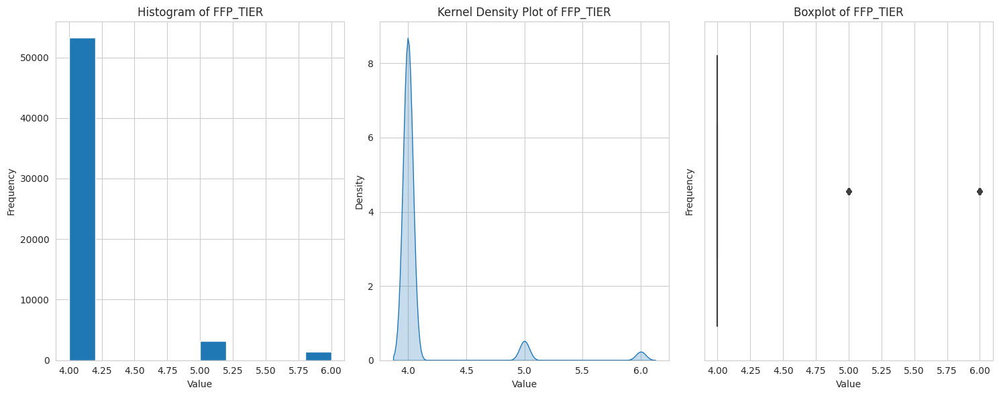

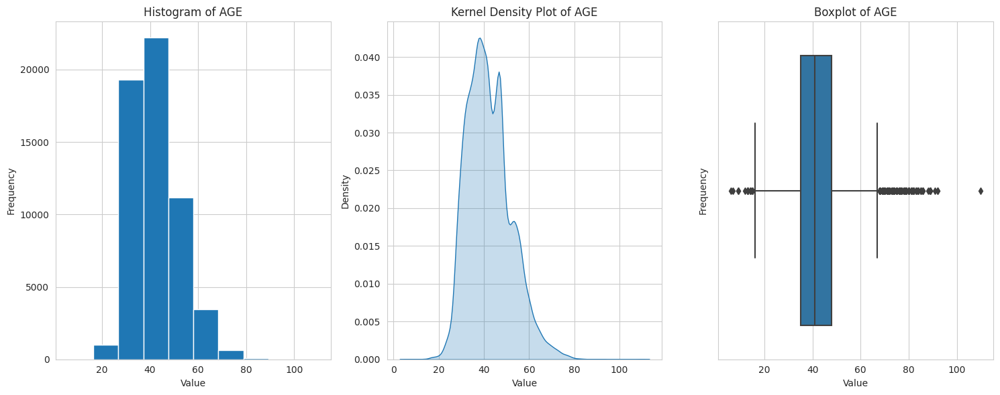

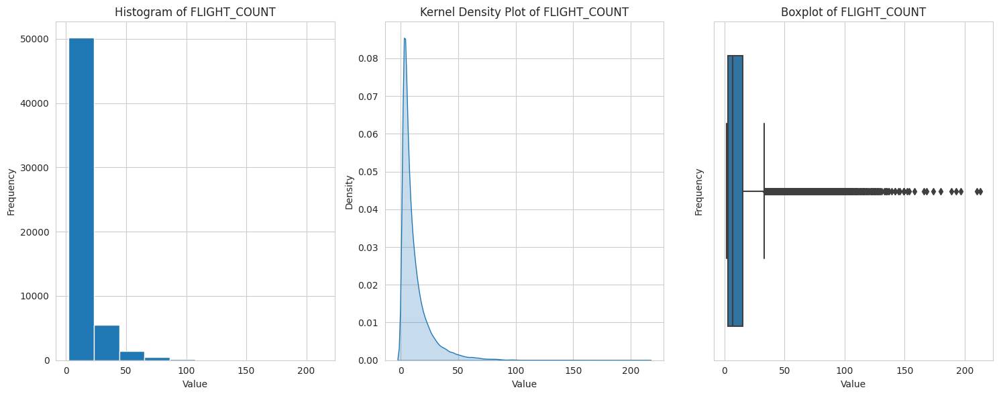

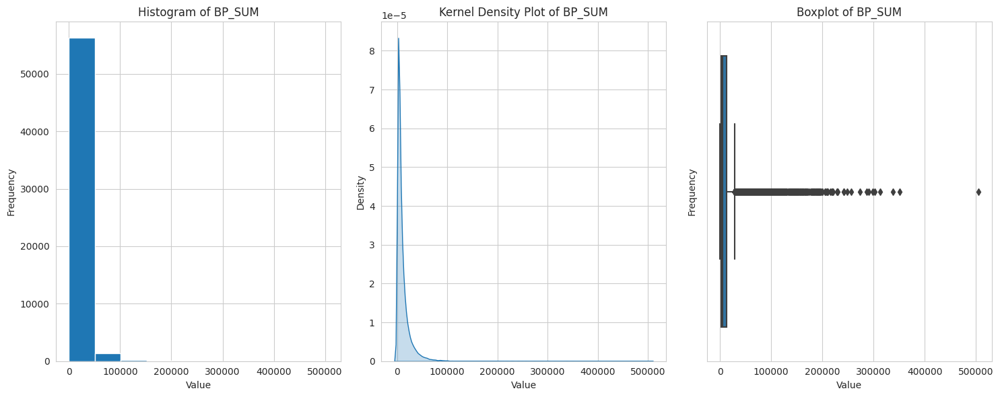

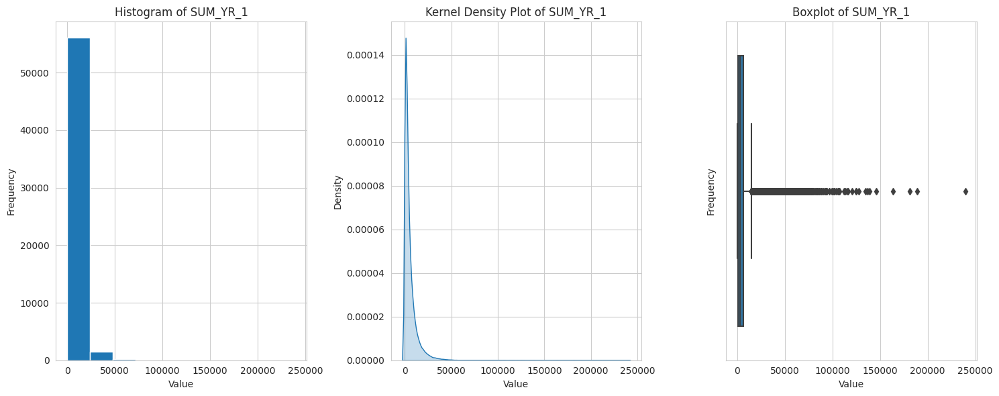

...

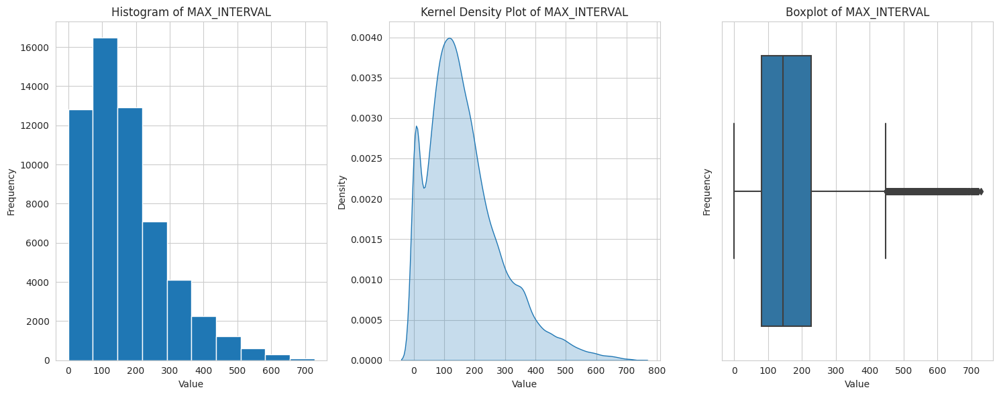

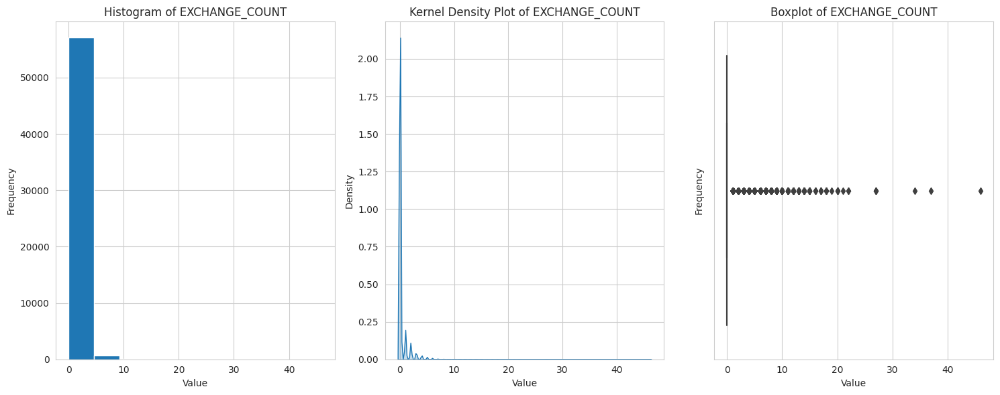

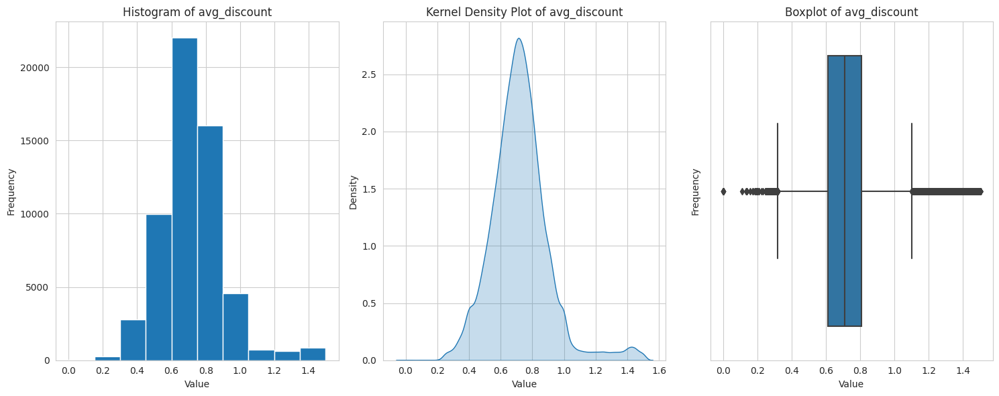

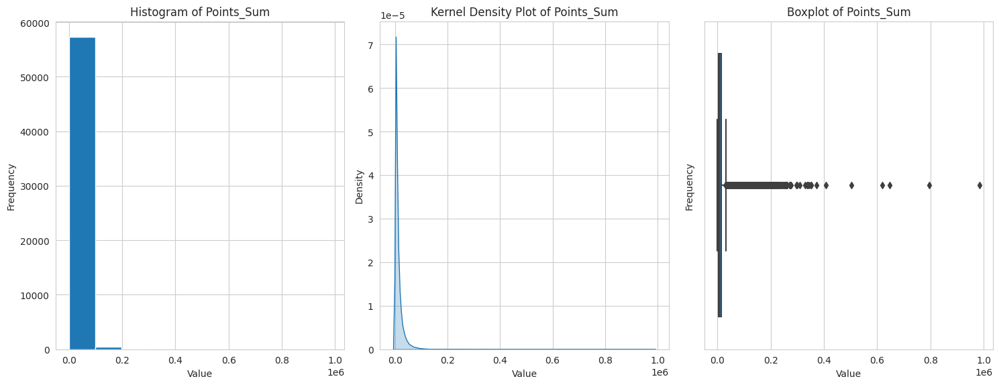

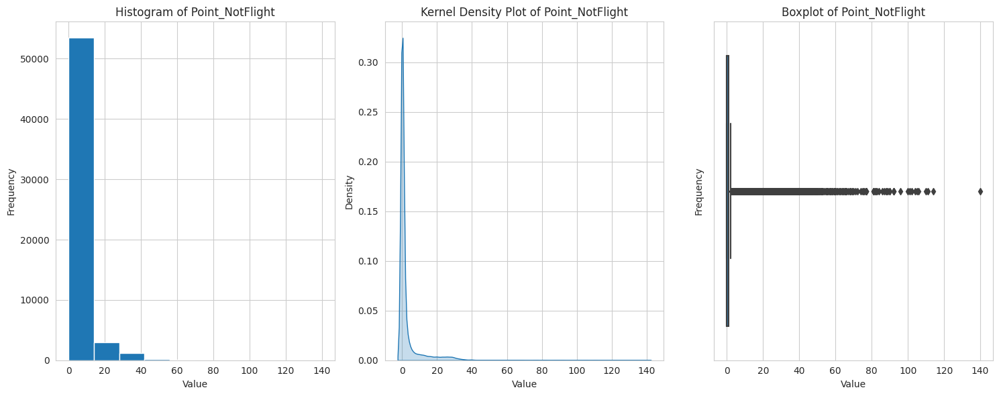

In [ ]:
df_num = df.drop(columns=['MEMBER_NO', 'GENDER', 'WORK_CITY',	'WORK_PROVINCE',	'WORK_COUNTRY', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE'])

# Assuming your DataFrame is named 'df'
for col in df_num.columns:
    # Create a figure with three subplots
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    # Histogram
    ax[0].hist(df_num[col], bins=10)
    ax[0].set_xlabel('Value')
    ax[0].set_ylabel('Frequency')
    ax[0].set_title('Histogram of {}'.format(col))

    # Kernel Density Plot
    sns.kdeplot(df_num[col], ax=ax[1], fill = True)
    ax[1].set_xlabel('Value')
    ax[1].set_ylabel('Density')
    ax[1].set_title('Kernel Density Plot of {}'.format(col))

    # Boxplot
    sns.boxplot(x = df_num[col], ax=ax[2])
    ax[2].set_xlabel('Value')
    ax[2].set_ylabel('Frequency')
    ax[2].set_title('Boxplot of {}'.format(col))

    # Show the plots
    plt.tight_layout()
    plt.show()

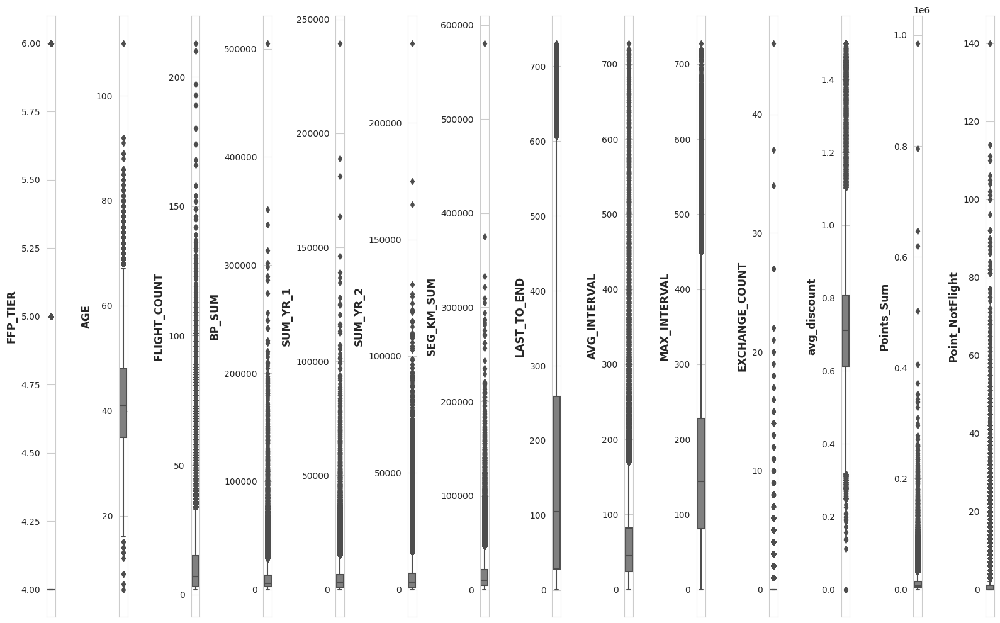

In [ ]:
numericals = df_num.columns.to_list()

fig = plt.figure(figsize=(16, 10))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(1, len(numericals), i+1)
    sns.boxplot(y=df[numericals[i]], color='gray', orient='v', ax=ax)
    ax.set_ylabel(numericals[i], fontdict={'fontsize': 12, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

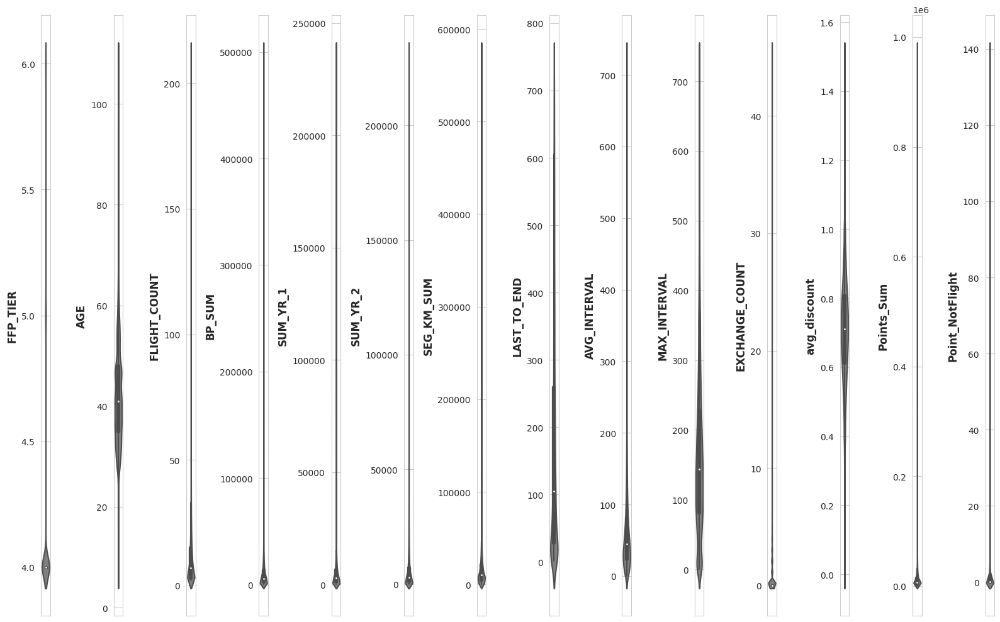

In [ ]:
fig = plt.figure(figsize=(16, 10))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(1, len(numericals), i+1)
    sns.violinplot(y=df[numericals[i]], color='gray', orient='v', ax=ax)
    ax.set_ylabel(numericals[i], fontdict={'fontsize': 12, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

In [ ]:
print(f'number of rows before handling outliers : {len(df)}')

filtered_entries = np.array([True] * len(df))

for col in numericals :
    zscore = abs(stats.zscore(df[col])) # hitung absolute z-scorenya
    filtered_entries = (zscore < 5) & filtered_entries # keep yang kurang dari 5 absolute z-scorenya
    
df_outlier = df[filtered_entries] # filter, cuma ambil yang z-scorenya dibawah 5

print(f'number of rows after handling outliers: {len(df_outlier)}')
print(f'percentage of row removed after handling outlier: {(1-len(df_outlier)/len(df))*100}%')

number of rows before handling outliers : 57860
number of rows after handling outliers: 55359
percentage of row removed after handling outlier: 4.322502592464572%


In [ ]:
df_outlier.sample(5)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,...,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
34981,51884,2012-10-01,2013-03-03,Female,4,shenzhenshi,guangdongsheng,CN,27.0,2014-03-31,...,1311.0,17382,2014-02-14,47,34.800000,121,0,0.340147,5057,0
59550,17042,2012-04-22,2013-03-19,Male,4,shenyang,liaoning,CN,56.0,2014-03-31,...,0.0,5344,2013-03-25,373,6.000000,6,0,0.250000,0,0
39258,48723,2008-12-05,2009-08-01,Male,4,shanghai,shanghai,CN,50.0,2014-03-31,...,0.0,6644,2013-08-05,240,118.250000,222,0,0.725646,4185,0
42254,44804,2008-04-18,2008-04-18,Male,5,changchun,jilin,CN,42.0,2014-03-31,...,0.0,8243,2013-01-21,436,62.500000,122,1,0.505247,1894,1
17426,51525,2012-07-19,2012-07-19,Male,4,beijing,beijing,CN,31.0,2014-03-31,...,9383.0,21123,2014-03-11,21,50.083333,140,0,0.662483,11663,0


In [ ]:
df_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55359 entries, 412 to 62986
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   MEMBER_NO          55359 non-null  int64         
 1   FFP_DATE           55359 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE  55359 non-null  datetime64[ns]
 3   GENDER             55359 non-null  object        
 4   FFP_TIER           55359 non-null  int64         
 5   WORK_CITY          55359 non-null  object        
 6   WORK_PROVINCE      55359 non-null  object        
 7   WORK_COUNTRY       55359 non-null  object        
 8   AGE                55359 non-null  float64       
 9   LOAD_TIME          55359 non-null  datetime64[ns]
 10  FLIGHT_COUNT       55359 non-null  int64         
 11  BP_SUM             55359 non-null  int64         
 12  SUM_YR_1           55359 non-null  float64       
 13  SUM_YR_2           55359 non-null  float64       
 14  SEG_

In [ ]:
df = df_outlier.copy()
df.shape

(55359, 23)

In [ ]:
df_outlier.drop(columns=['MEMBER_NO', 'GENDER', 'WORK_CITY',	'WORK_PROVINCE',	'WORK_COUNTRY', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE'], inplace=True)

<ipython-input-30-2205d9122a5b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_outlier.drop(columns=['MEMBER_NO', 'GENDER', 'WORK_CITY',	'WORK_PROVINCE',	'WORK_COUNTRY', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE'], inplace=True)


In [ ]:
df_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55359 entries, 412 to 62986
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FFP_TIER         55359 non-null  int64  
 1   AGE              55359 non-null  float64
 2   FLIGHT_COUNT     55359 non-null  int64  
 3   BP_SUM           55359 non-null  int64  
 4   SUM_YR_1         55359 non-null  float64
 5   SUM_YR_2         55359 non-null  float64
 6   SEG_KM_SUM       55359 non-null  int64  
 7   LAST_TO_END      55359 non-null  int64  
 8   AVG_INTERVAL     55359 non-null  float64
 9   MAX_INTERVAL     55359 non-null  int64  
 10  EXCHANGE_COUNT   55359 non-null  int64  
 11  avg_discount     55359 non-null  float64
 12  Points_Sum       55359 non-null  int64  
 13  Point_NotFlight  55359 non-null  int64  
dtypes: float64(5), int64(9)
memory usage: 6.3 MB


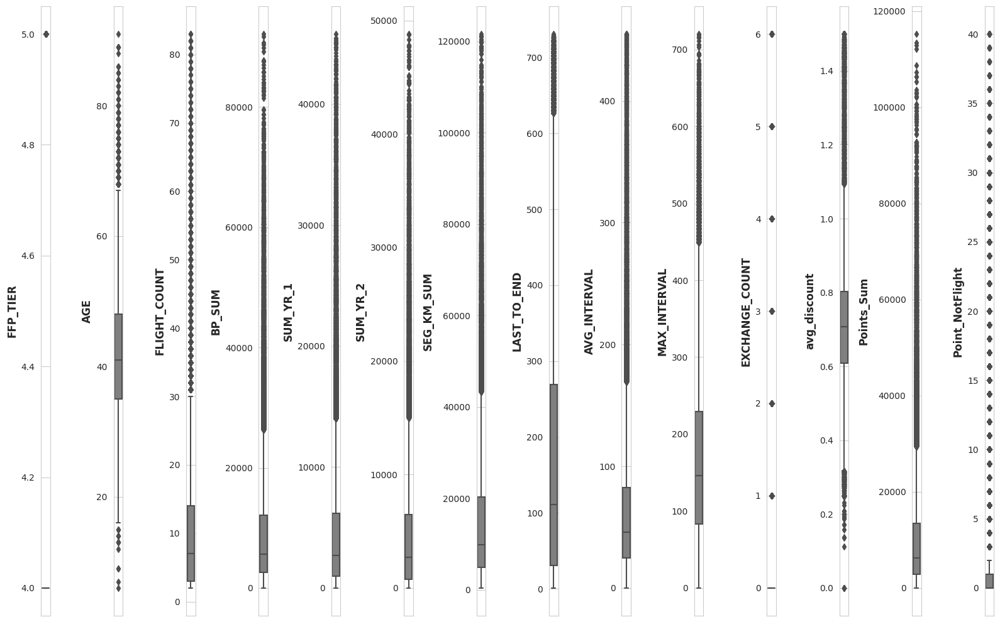

In [ ]:
#outliers after z-score trimming
fig = plt.figure(figsize=(16, 10))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(1, len(numericals), i+1)
    sns.boxplot(y=df_outlier[numericals[i]], color='gray', orient='v', ax=ax)
    ax.set_ylabel(numericals[i], fontdict={'fontsize': 12, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

In [ ]:
df_outlier['FFP_TIER'].value_counts()

4    52511
5     2848
Name: FFP_TIER, dtype: int64

In [ ]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57860 entries, 0 to 62986
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FFP_TIER         57860 non-null  int64  
 1   AGE              57860 non-null  float64
 2   FLIGHT_COUNT     57860 non-null  int64  
 3   BP_SUM           57860 non-null  int64  
 4   SUM_YR_1         57860 non-null  float64
 5   SUM_YR_2         57860 non-null  float64
 6   SEG_KM_SUM       57860 non-null  int64  
 7   LAST_TO_END      57860 non-null  int64  
 8   AVG_INTERVAL     57860 non-null  float64
 9   MAX_INTERVAL     57860 non-null  int64  
 10  EXCHANGE_COUNT   57860 non-null  int64  
 11  avg_discount     57860 non-null  float64
 12  Points_Sum       57860 non-null  int64  
 13  Point_NotFlight  57860 non-null  int64  
dtypes: float64(5), int64(9)
memory usage: 6.6 MB


Kami menghapus nilai yang duplikat. sehingga terjadi kehilangan informasi yang cukup banyak pada fitur target `FFP_Tier`, untuk segmentasi **kelas 6** akan hilang seluruhnya. 

In [ ]:
df_num = df_outlier.copy()

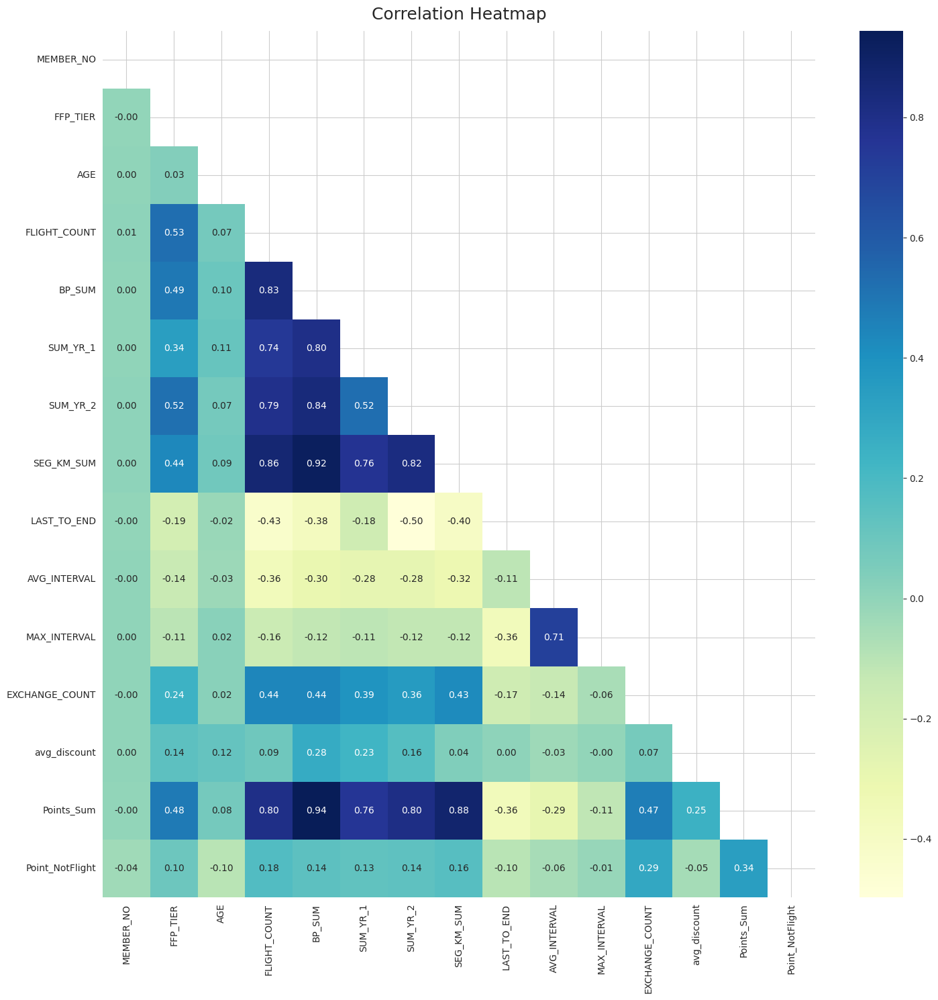

In [ ]:
plt.figure(figsize=(15, 15))

p = df.corr(numeric_only=True)

mask = np.triu(np.ones_like(p, dtype=bool))
heatmap = sns.heatmap(p, cmap='YlGnBu', mask=mask, annot=True, fmt='.2f')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

plt.tight_layout()
plt.show()

In [ ]:
# Set the threshold for feature selection
threshold = 0.7

# Create a mask to filter out highly correlated features
mask = (p.abs() >= threshold) & (p != 1)

# Get the names of the highly correlated features
highly_correlated = set()
for col in mask.columns:
    correlated_cols = mask.index[mask[col]].tolist()
    if correlated_cols:
        correlated_cols.append(col)
        highly_correlated.add(tuple(sorted(correlated_cols)))

# Print the highly correlated features
print('Highly correlated features:')
for cols in highly_correlated:
    print('- {}'.format(', '.join(cols)))


Highly correlated features:
- AVG_INTERVAL, MAX_INTERVAL
- BP_SUM, FLIGHT_COUNT, Points_Sum, SEG_KM_SUM, SUM_YR_2
- BP_SUM, FLIGHT_COUNT, Points_Sum, SEG_KM_SUM, SUM_YR_1, SUM_YR_2
- BP_SUM, FLIGHT_COUNT, Points_Sum, SEG_KM_SUM, SUM_YR_1


The following are the possible redundant features:
- SUM_YR_2: because it is highly correlated with BP_SUM, FLIGHT_COUNT, Points_Sum, and SEG_KM_SUM, and also has high correlation with SUM_YR_1 which is also correlated with the same features.
- MAX_INTERVAL: because it is highly correlated with AVG_INTERVAL, and they both represent the same concept of time intervals.
- SUM_YR_1: because it is highly correlated with BP_SUM, FLIGHT_COUNT, Points_Sum, and SEG_KM_SUM, and also has high correlation with SUM_YR_2 which is also correlated with the same features.

<Figure size 1500x1500 with 0 Axes>

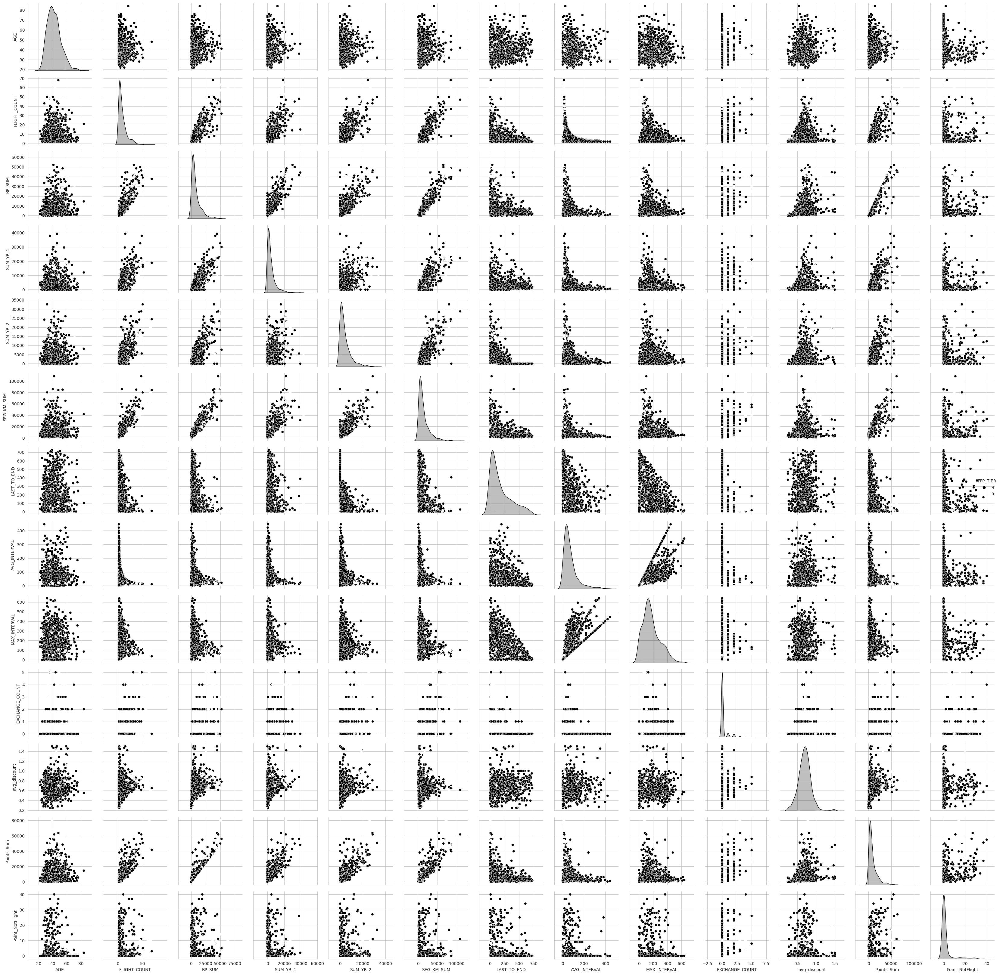

In [ ]:
q = df_num.sample(1000, random_state=42)

plt.figure(figsize=(15, 15))
sns.pairplot(q, diag_kind='kde', hue='FFP_TIER', palette='afmhot')

plt.tight_layout()
plt.show()

## Some useful insight

Notes:

1. Frequent Flyer Program (FFP) Tier: It appears that members in higher FFP tiers tend to take more flights, as they likely receive more benefits and rewards from the airline. The data could be analyzed to see if there is a significant difference in flight counts between different FFP tiers.

2. Age: The age of the member could also be an important factor in flight count, as older members may have more disposable income and time to travel. Analyzing the data by age group could reveal any patterns in flight counts.

3. Flight Frequency: The dataset contains information on the frequency of flights taken by each member, which could provide insights into the loyalty and engagement of the member. For example, if a member takes a high number of flights but with low frequency, it may indicate that they are not a loyal customer.

4. Work Location: The dataset includes information on the member's work location, which could be analyzed to identify the most common travel destinations for business purposes. This information could be useful for airlines to optimize their routes and services.

5. Points: The dataset contains information on the number of points earned by each member, which could be analyzed to identify any correlation with flight counts or other variables. This could provide insights into the behavior and preferences of members, and could be useful for designing targeted marketing campaigns or loyalty programs.

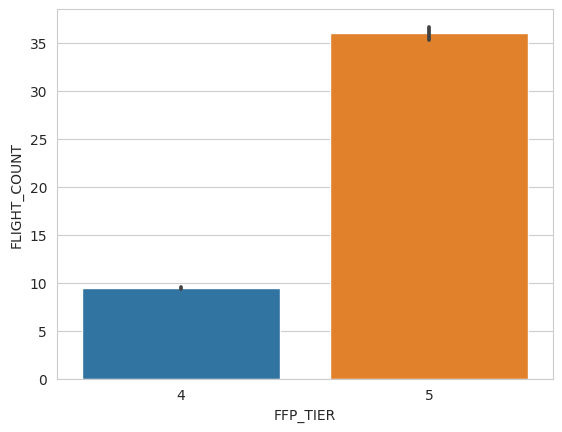

In [ ]:
sns.barplot(x='FFP_TIER', y='FLIGHT_COUNT', data=df)

plt.show()

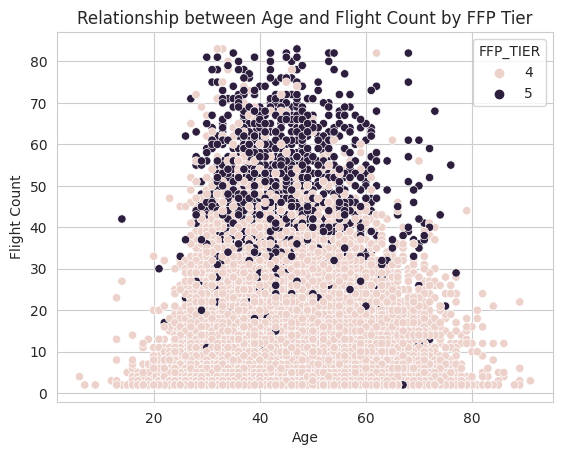

In [ ]:
sns.scatterplot(data=df, x='AGE', y='FLIGHT_COUNT', hue='FFP_TIER')
plt.title('Relationship between Age and Flight Count by FFP Tier')
plt.xlabel('Age')
plt.ylabel('Flight Count')
plt.show()

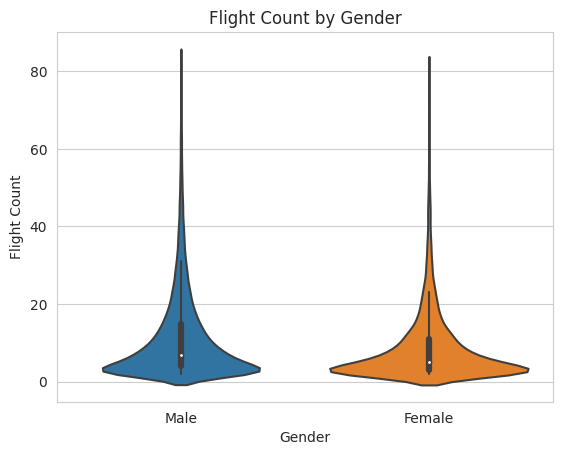

In [ ]:
sns.violinplot(x='GENDER', y='FLIGHT_COUNT', data=df)
plt.title('Flight Count by Gender')
plt.xlabel('Gender')
plt.ylabel('Flight Count')
plt.show()

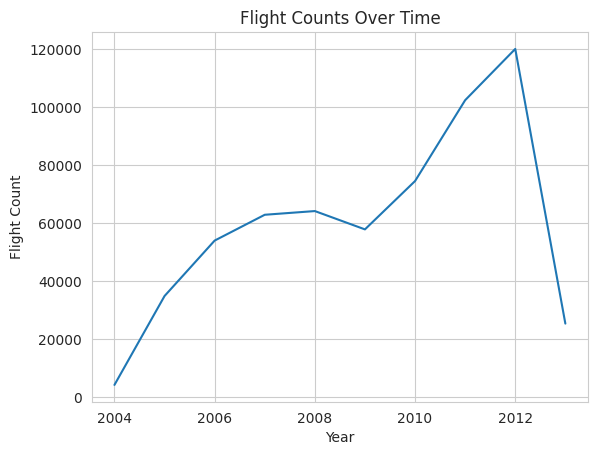

In [ ]:
# assuming flight dates are stored in a column named "FLIGHT_DATE"
df['year'] = pd.DatetimeIndex(df['FFP_DATE']).year

# group data by year and sum the flight counts
flight_counts_by_year = df.groupby('year')['FLIGHT_COUNT'].sum()

# create a line chart of flight counts over time
plt.plot(flight_counts_by_year.index, flight_counts_by_year.values)
plt.title('Flight Counts Over Time')
plt.xlabel('Year')
plt.ylabel('Flight Count')
plt.show()


What is the average number of flights taken by members in the dataset?

In [ ]:
avg_flights = df['FLIGHT_COUNT'].mean()
print("The average number of flights taken by members in the dataset is:", round(avg_flights, 2))

The average number of flights taken by members in the dataset is: 10.84


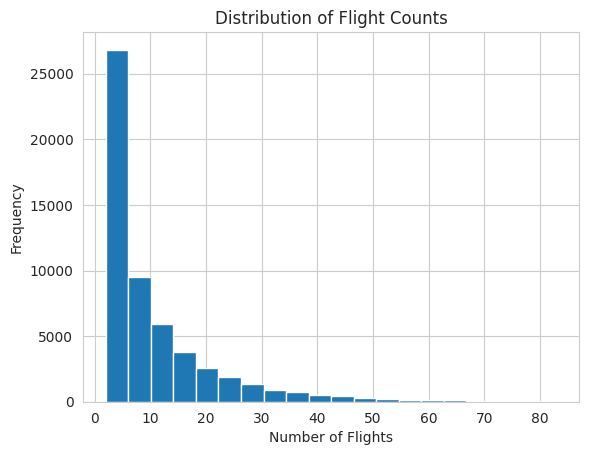

In [ ]:
plt.hist(df['FLIGHT_COUNT'], bins=20)
plt.title("Distribution of Flight Counts")
plt.xlabel("Number of Flights")
plt.ylabel("Frequency")
plt.show()

What is the distribution of membership tiers among members in the dataset?

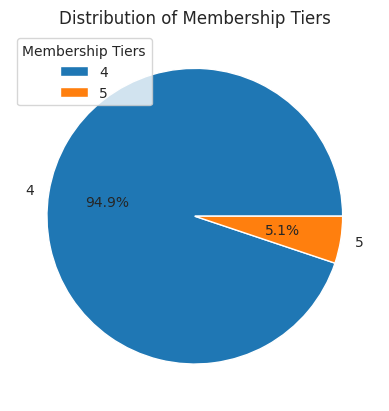

In [ ]:
tier_counts = df['FFP_TIER'].value_counts()

plt.pie(tier_counts, labels=tier_counts.index, autopct='%1.1f%%')
plt.title("Distribution of Membership Tiers")
plt.legend(title="Membership Tiers", loc="best")
plt.show()

What is the average age of members in the dataset? How does this vary by membership tier?

In [ ]:
avg_age = df['AGE'].mean()
print("The average age of members in the dataset is:", round(avg_age, 2))

The average age of members in the dataset is: 42.09


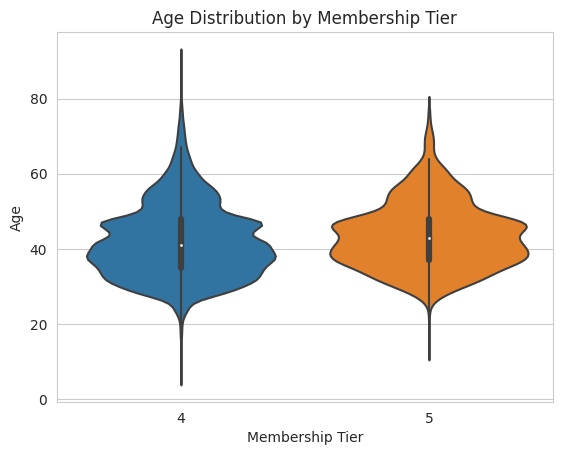

In [ ]:
sns.violinplot(x='FFP_TIER', y='AGE', data=df)
plt.title("Age Distribution by Membership Tier")
plt.xlabel("Membership Tier")
plt.ylabel("Age")
plt.show()

What is the average amount of money spent by members on flights (BP_SUM) in the dataset?

In [ ]:
avg_spending = df['BP_SUM'].mean()
print("The average amount spent on flights by members in the dataset is:", round(avg_spending, 2))

The average amount spent on flights by members in the dataset is: 9401.71


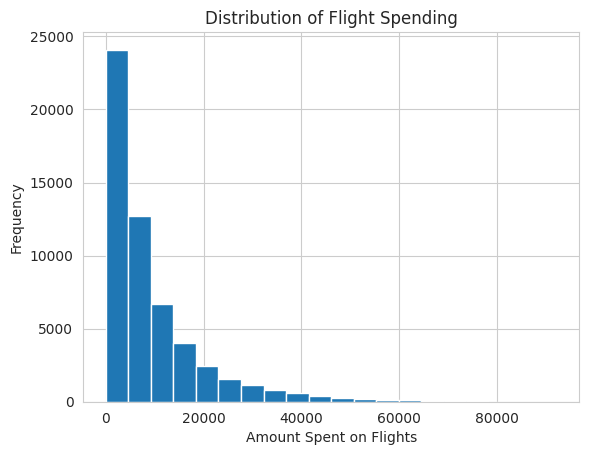

In [ ]:
plt.hist(df['BP_SUM'], bins=20)
plt.title("Distribution of Flight Spending")
plt.xlabel("Amount Spent on Flights")
plt.ylabel("Frequency")
plt.show()

What is the distribution of flight distances (SEG_KM_SUM) among members in the dataset?

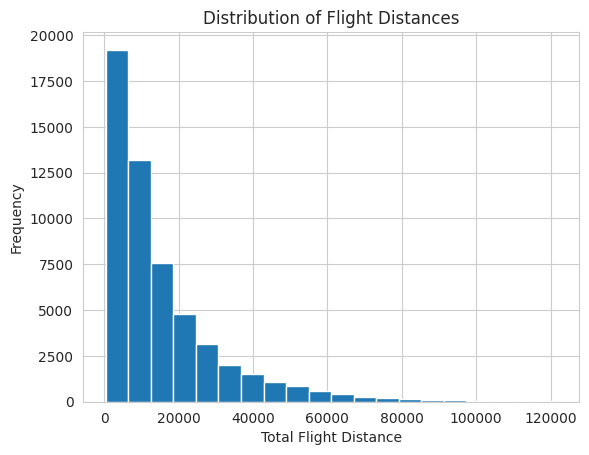

In [ ]:
plt.hist(df['SEG_KM_SUM'], bins=20)
plt.title("Distribution of Flight Distances")
plt.xlabel("Total Flight Distance")
plt.ylabel("Frequency")
plt.show()

## Statistic

In [ ]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55359 entries, 412 to 62986
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FFP_TIER         55359 non-null  int64  
 1   AGE              55359 non-null  float64
 2   FLIGHT_COUNT     55359 non-null  int64  
 3   BP_SUM           55359 non-null  int64  
 4   SUM_YR_1         55359 non-null  float64
 5   SUM_YR_2         55359 non-null  float64
 6   SEG_KM_SUM       55359 non-null  int64  
 7   LAST_TO_END      55359 non-null  int64  
 8   AVG_INTERVAL     55359 non-null  float64
 9   MAX_INTERVAL     55359 non-null  int64  
 10  EXCHANGE_COUNT   55359 non-null  int64  
 11  avg_discount     55359 non-null  float64
 12  Points_Sum       55359 non-null  int64  
 13  Point_NotFlight  55359 non-null  int64  
dtypes: float64(5), int64(9)
memory usage: 6.3 MB


In [ ]:
df_num.describe()

,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
count,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000
mean,4.051446,42.094763,10.837605,9401.711917,4654.456403,4842.894236,15503.496017,177.476905,65.880144,166.609079,0.236547,0.713332,10546.425766,2.402356
std,0.220908,9.757350,11.138860,10622.015806,5728.330670,6151.763809,15909.874091,182.169987,66.007954,119.343606,0.746700,0.176037,12172.011927,6.299755
min,4.000000,6.000000,2.000000,0.000000,0.000000,0.000000,368.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,35.000000,3.000000,2559.000000,986.000000,789.500000,4840.000000,31.000000,24.857143,83.000000,0.000000,0.608324,2811.000000,0.000000
50%,4.000000,41.000000,7.000000,5601.000000,2706.000000,2709.000000,9882.000000,111.000000,45.857143,146.000000,0.000000,0.707765,6225.000000,0.000000
75%,4.000000,48.000000,14.000000,12073.500000,6186.500000,6465.500000,20229.000000,269.000000,82.612500,229.000000,0.000000,0.802262,13456.000000,1.000000
max,5.000000,91.000000,83.000000,92162.000000,45787.000000,48812.000000,121632.000000,731.000000,455.000000,720.000000,6.000000,1.500000,115264.000000,40.000000


In [ ]:
from scipy.stats import f_oneway, chi2_contingency

# separate the target variable from the features
X = df_num.drop(columns=['FFP_TIER'])
y = df_num['FFP_TIER']

# perform ANOVA for each feature
f_scores = []
p_values = []
for col in X.columns:
    groups = []
    for target_value in np.unique(y):
        groups.append(X.loc[y==target_value, col])
    f, p = f_oneway(*groups)
    f_scores.append(f)
    p_values.append(p)
anova_results = pd.DataFrame({'Feature': X.columns, 'F-score': f_scores, 'P-value': p_values})

# perform Chi-square test for each feature
chi2_scores = []
p_values = []
for col in X.columns:
    contingency_table = pd.crosstab(X[col], y)
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    chi2_scores.append(chi2)
    p_values.append(p)
chi2_results = pd.DataFrame({'Feature': X.columns, 'Chi2-score': chi2_scores, 'P-value': p_values})

# print the results
print("\nANOVA results:")
print(anova_results)
print("\nChi-square test results:")
print(chi2_results)


ANOVA results:
            Feature       F-score        P-value
0               AGE     66.014712   4.567286e-16
1      FLIGHT_COUNT  21159.085033   0.000000e+00
2            BP_SUM  17460.588427   0.000000e+00
3          SUM_YR_1   7215.294527   0.000000e+00
4          SUM_YR_2  20607.346297   0.000000e+00
5        SEG_KM_SUM  13065.331391   0.000000e+00
6       LAST_TO_END   2070.358123   0.000000e+00
7      AVG_INTERVAL   1177.331770  2.494762e-255
8      MAX_INTERVAL    635.264763  2.196756e-139
9    EXCHANGE_COUNT   3498.533997   0.000000e+00
10     avg_discount   1147.131268  6.693419e-249
11       Points_Sum  16826.841570   0.000000e+00
12  Point_NotFlight    540.428042  5.669593e-119

Chi-square test results:
            Feature    Chi2-score       P-value
0               AGE    240.560187  5.607007e-18
1      FLIGHT_COUNT  19152.012979  0.000000e+00
2            BP_SUM  45669.057593  0.000000e+00
3          SUM_YR_1  32464.188395  0.000000e+00
4          SUM_YR_2  43027.20749

In [ ]:
anova_p_values = anova_results['P-value']
chi2_p_values = chi2_results['P-value']

if all(anova_p_values < 0.05) and all(chi2_p_values < 0.05):
    print("All features are significant")
else:
    print("The following features are not significant:")
    if any(anova_p_values >= 0.05):
        print(anova_results.loc[anova_p_values >= 0.05, 'Feature'])
    if any(chi2_p_values >= 0.05):
        print(chi2_results.loc[chi2_p_values >= 0.05, 'Feature'])

All features are significant


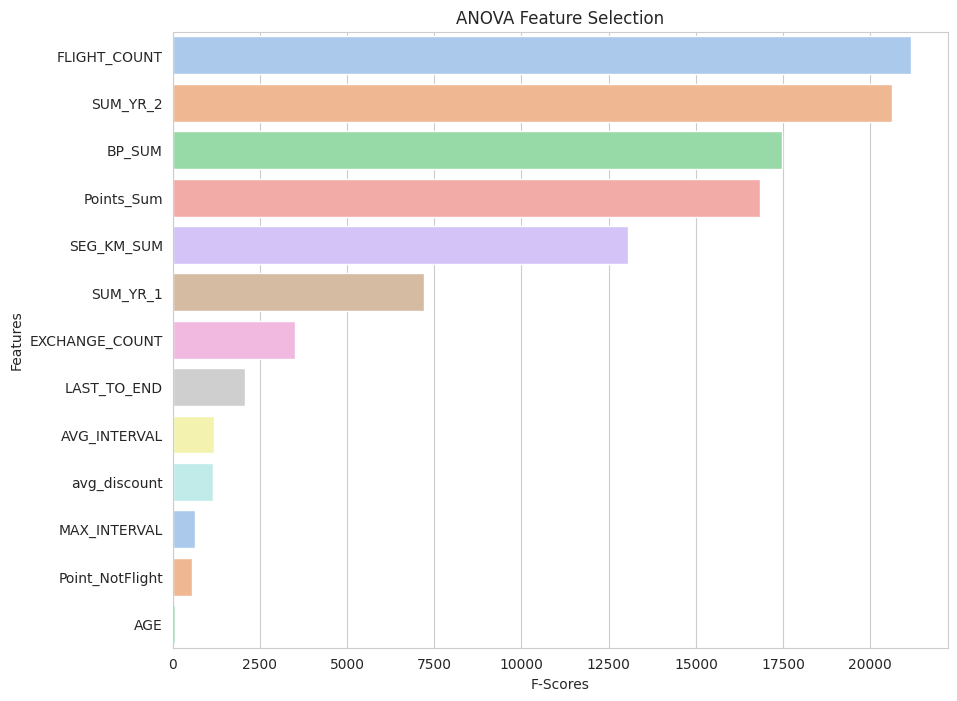

In [ ]:
# sort the dataframe by descending f-scores
anova_results = anova_results.sort_values(by='F-score', ascending=False, ignore_index=True)

# create horizontal bar plot for f-scores
plt.figure(figsize=(10, 8))
sns.barplot(x='F-score', y='Feature', data=anova_results, orient='h', palette='pastel')
plt.title('ANOVA Feature Selection')
plt.xlabel('F-Scores')
plt.ylabel('Features')
plt.show()

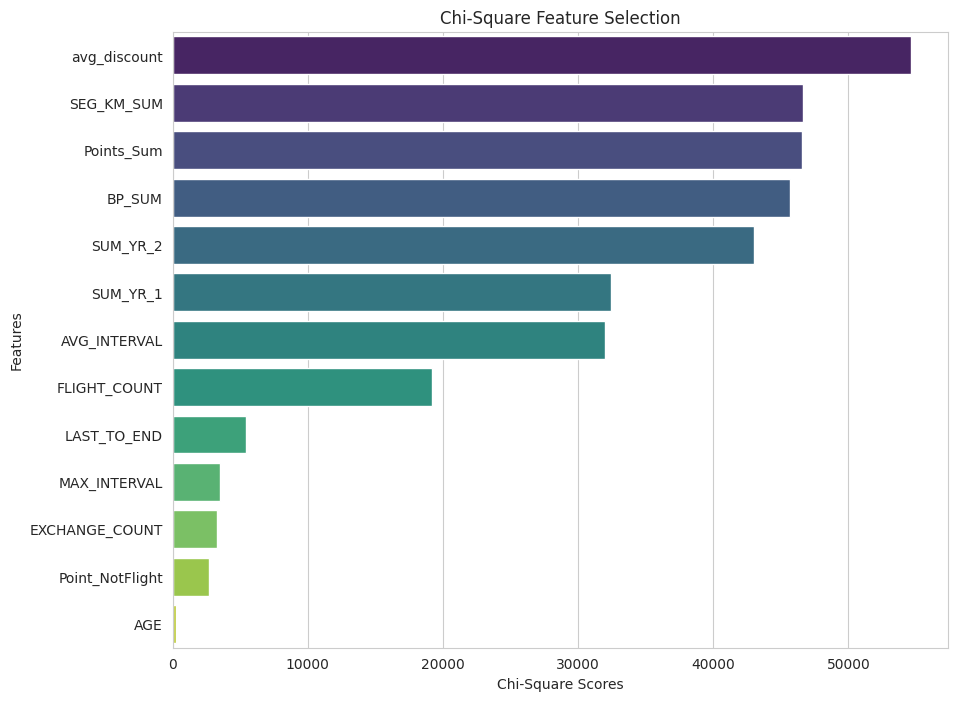

In [ ]:
# sort the dataframe by descending chi2_scores
chi2_results = chi2_results.sort_values(by='Chi2-score', ascending=False)

# print the feature scores
chi2_results = chi2_results.reset_index(drop=True)

# create horizontal bar plot for chi-square scores
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='Chi2-score', y='Feature', data=chi2_results, palette='viridis')

# set title and labels
ax.set_title('Chi-Square Feature Selection')
ax.set_xlabel('Chi-Square Scores')
ax.set_ylabel('Features')

# show the plot
plt.show()

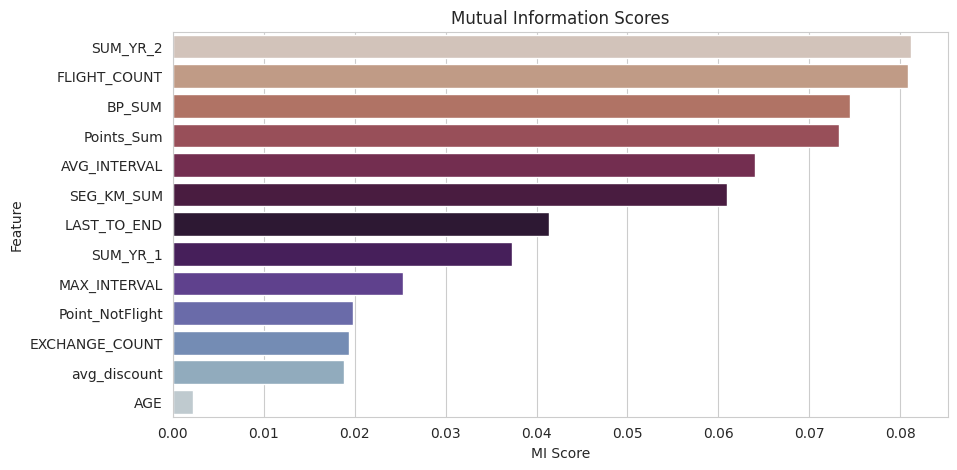

In [ ]:
from sklearn.feature_selection import mutual_info_classif

# perform mutual information for each feature
mi_scores = mutual_info_classif(X, y)

# create a DataFrame with feature names and MI scores
mi_df = pd.DataFrame({'Feature': X.columns, 'MI Score': mi_scores})

# sort the DataFrame by MI score in ascending order
mi_df = mi_df.sort_values('MI Score', ascending=False)

# plot the horizontal bar chart using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(data=mi_df, x='MI Score', y='Feature', palette='twilight_r')
plt.xlabel('MI Score')
plt.ylabel('Feature')
plt.title('Mutual Information Scores')
plt.show()


In [ ]:
# set the MI score threshold
threshold = 0.07

# check if all MI scores are above the threshold
if (mi_df['MI Score'] > threshold).all():
    print("All features have MI scores above the threshold.")
else:
    print("Some features have MI scores below the threshold:")
    print(mi_df[mi_df['MI Score'] <= threshold])

Some features have MI scores below the threshold:
            Feature  MI Score
7      AVG_INTERVAL  0.064072
5        SEG_KM_SUM  0.060981
6       LAST_TO_END  0.041379
3          SUM_YR_1  0.037314
8      MAX_INTERVAL  0.025346
12  Point_NotFlight  0.019848
9    EXCHANGE_COUNT  0.019431
10     avg_discount  0.018797
0               AGE  0.002270


Mutual information (MI) is a measure of the dependence between two variables, in this case, the features and the target variable. The MI score indicates how much information the presence or absence of a certain feature provides about the target variable.

In the context of feature selection, MI can be used to measure the relevance of each feature to the target variable. Features with high MI scores are considered to be more informative and potentially more important for predicting the target variable.

MI scores range from 0 (no information gain) to 1 (perfect information gain). Therefore, a higher MI score indicates a stronger relationship between the feature and the target variable. MI is often used as an alternative to correlation analysis for non-linear relationships between variables.

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif, chi2, mutual_info_classif

# Use SelectKBest to select the top 10 features based on F-score
f_selector = SelectKBest(score_func=f_classif, k=10)
f_selector.fit(X, y)
f_scores = f_selector.scores_
f_feature_indices = f_selector.get_support(indices=True)

# Use SelectKBest to select the top 10 features based on Chi-square score
chi2_selector = SelectKBest(score_func=chi2, k=10)
chi2_selector.fit(X, y)
chi2_scores = chi2_selector.scores_
chi2_feature_indices = chi2_selector.get_support(indices=True)

# Use SelectKBest to select the top 10 features based on MI score
mi_selector = SelectKBest(score_func=mutual_info_classif, k=10)
mi_selector.fit(X, y)
mi_scores = mi_selector.scores_
mi_feature_indices = mi_selector.get_support(indices=True)

# Combine the scores from all three methods
combined_scores = f_scores + chi2_scores + mi_scores

In [ ]:
# create a DataFrame with feature selection results
results = pd.DataFrame({'Feature': X.columns,
                        'F-score': f_scores,
                        'Chi2-score': chi2_scores,
                        'MI score': mi_scores,
                        'Combined score': combined_scores})

# select the top 6 features based on the combined score
selected_features = results.nlargest(10, 'Combined score')['Feature'].tolist()

# print the results
print("Selected features:")
print(results.nlargest(10, 'Combined score'))

Selected features:
           Feature       F-score    Chi2-score  MI score  Combined score
11      Points_Sum  16826.841570  1.812852e+08  0.073144    1.813021e+08
5       SEG_KM_SUM  13065.331391  1.725865e+08  0.061118    1.725996e+08
2           BP_SUM  17460.588427  1.592979e+08  0.074287    1.593153e+08
4         SUM_YR_2  20607.346297  1.173510e+08  0.081380    1.173717e+08
3         SUM_YR_1   7215.294527  4.500280e+07  0.037279    4.501002e+07
6      LAST_TO_END   2070.358123  3.731804e+05  0.040947    3.752508e+05
1     FLIGHT_COUNT  21159.085033  1.752559e+05  0.080803    1.964151e+05
7     AVG_INTERVAL   1177.331770  7.624388e+04  0.064158    7.742128e+04
8     MAX_INTERVAL    635.264763  5.369165e+04  0.024083    5.432694e+04
9   EXCHANGE_COUNT   3498.533997  7.756284e+03  0.018368    1.125484e+04


# Selected features

1. Points_Sum  (Jumlah poin): 
> Fitur ini penting karena menunjukkan seberapa banyak poin yang telah dikumpulkan oleh pelanggan. Hal ini dapat digunakan untuk mengidentifikasi pelanggan yang mungkin lebih tertarik pada program penghargaan atau diskon yang didasarkan pada poin yang dikumpulkan.

2. SEG_KM_SUM  (Total jarak penerbangan): 
> Fitur ini penting karena menunjukkan seberapa jauh pelanggan melakukan perjalanan menggunakan maskapai penerbangan. Hal ini dapat digunakan untuk mengidentifikasi pelanggan yang sering melakukan perjalanan jarak jauh dan mungkin membutuhkan layanan khusus atau penawaran diskon.

3. BP_SUM  (Rencana penerbangan):
> Fitur ini penting karena menunjukkan besarnya biaya yang dikeluarkan oleh pelanggan pada rencana perjalanannya. Hal ini dapat digunakan untuk mengidentifikasi pelanggan yang potensial untuk menikmati penawaran atau program pemasaran khusus, berdasarkan jumlah biaya yang mereka keluarkan untuk perjalanan.

4. SUM_YR_2 (Votes Prices): 
> Fitur ini penting karena menunjukkan besarnya pengeluaran pelanggan pada maskapai penerbangan selama dua tahun terakhir. Hal ini dapat digunakan untuk mengidentifikasi pelanggan yang cenderung menggunakan maskapai penerbangan dan mungkin membutuhkan program pemasaran atau penawaran yang khusus.

5. LAST_TO_END (Jarak waktu penerbangan terakhir ke pesanan penerbangan paling akhir):
> Fitur digunakan untuk mengetahui jarak waktu terakhir pelanggan melakukan penerbangan dan pesanan penerbangan terakhirnya, yang dapat membantu dalam menentukan strategi pemasaran yang tepat.

6. FLIGHT_COUNT  (Jumlah penerbangan):
> Fitur ini penting karena menunjukkan seberapa sering pelanggan melakukan penerbangan. Hal ini dapat digunakan untuk mengidentifikasi pelanggan yang loyal atau memiliki kebutuhan perjalanan yang tinggi dan mungkin perlu mendapatkan penawaran atau program pemasaran yang khusus.

In [ ]:
features = ['Points_Sum', 'SEG_KM_SUM', 'BP_SUM', 'SUM_YR_2', 'LAST_TO_END', 'FLIGHT_COUNT']
x = df_num[features].copy()
y = df_num['FFP_TIER'].copy()

x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55359 entries, 412 to 62986
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Points_Sum    55359 non-null  int64  
 1   SEG_KM_SUM    55359 non-null  int64  
 2   BP_SUM        55359 non-null  int64  
 3   SUM_YR_2      55359 non-null  float64
 4   LAST_TO_END   55359 non-null  int64  
 5   FLIGHT_COUNT  55359 non-null  int64  
dtypes: float64(1), int64(5)
memory usage: 3.0 MB


## Unsupervised Learning: Clustering

Melakukan standarisasi data

In [ ]:
# Standarisasi

scaler = StandardScaler()
x_scl = scaler.fit_transform(x)

In [ ]:
# Dataset awal

x.describe()

,Points_Sum,SEG_KM_SUM,BP_SUM,SUM_YR_2,LAST_TO_END,FLIGHT_COUNT
count,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000,55359.000000
mean,10546.425766,15503.496017,9401.711917,4842.894236,177.476905,10.837605
std,12172.011927,15909.874091,10622.015806,6151.763809,182.169987,11.138860
min,0.000000,368.000000,0.000000,0.000000,1.000000,2.000000
25%,2811.000000,4840.000000,2559.000000,789.500000,31.000000,3.000000
50%,6225.000000,9882.000000,5601.000000,2709.000000,111.000000,7.000000
75%,13456.000000,20229.000000,12073.500000,6465.500000,269.000000,14.000000
max,115264.000000,121632.000000,92162.000000,48812.000000,731.000000,83.000000


In [ ]:
# simpan di dataset baru setelah standarisasi

new_df = pd.DataFrame(x_scl, columns=features) 
new_df.describe()

,Points_Sum,SEG_KM_SUM,BP_SUM,SUM_YR_2,LAST_TO_END,FLIGHT_COUNT
count,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04
mean,3.285806e-17,-6.571612e-17,6.571612e-17,6.571612e-17,4.928709e-17,1.642903e-17
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00
min,-8.664567e-01,-9.513358e-01,-8.851236e-01,-7.872438e-01,-9.687573e-01,-7.934102e-01
25%,-6.355150e-01,-6.702500e-01,-6.442067e-01,-6.589055e-01,-8.040744e-01,-7.036336e-01
50%,-3.550329e-01,-3.533370e-01,-3.578178e-01,-3.468783e-01,-3.649202e-01,-3.445272e-01
75%,2.390402e-01,2.970197e-01,2.515353e-01,2.637651e-01,5.024094e-01,2.839090e-01
max,8.603222e+00,6.670666e+00,7.791462e+00,7.147463e+00,3.038525e+00,6.478495e+00


In [ ]:
new_df.sample(5, random_state=42)

,Points_Sum,SEG_KM_SUM,BP_SUM,SUM_YR_2,LAST_TO_END,FLIGHT_COUNT
47820,-0.707320,-0.839769,-0.702765,-0.787244,1.869277,-0.793410
9606,0.309941,1.050395,0.462938,0.916998,-0.524114,0.194132
6890,0.865401,0.805136,1.099452,0.008308,-0.255132,2.258994
273,5.113710,4.393067,5.054763,3.546674,-0.957778,4.413633
9526,0.413787,0.659062,0.581937,-0.042898,-0.732712,1.271452


## PCA

In [ ]:
# Melakukan PCA dengan 6 komponen
pca = PCA(n_components=6)
pca.fit(x_scl)
X_pca = pca.transform(x_scl)

df_pca = pd.DataFrame(X_pca, columns=['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6'])
df_pca.describe()

,pc1,pc2,pc3,pc4,pc5,pc6
count,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04
mean,6.571612e-17,3.285806e-17,1.129496e-17,-8.214515e-18,-4.107258e-17,7.059349e-17
std,2.153784e+00,8.906645e-01,4.702910e-01,4.450519e-01,3.242243e-01,2.089870e-01
min,-2.536298e+00,-1.375345e+00,-3.988983e+00,-4.782013e+00,-3.667582e+00,-1.785917e+00
25%,-1.412476e+00,-6.821878e-01,-1.566691e-01,-1.820944e-01,-9.701338e-02,-7.175084e-02
50%,-6.845622e-01,-2.143134e-01,3.587574e-03,1.737543e-02,1.363593e-02,-1.759894e-02
75%,7.174736e-01,5.090953e-01,1.579230e-01,1.979289e-01,9.371635e-02,4.000767e-02
max,1.476475e+01,3.972349e+00,5.486848e+00,5.095332e+00,3.744416e+00,4.125220e+00


In [ ]:
df_pca.sample(5, random_state=42)

,pc1,pc2,pc3,pc4,pc5,pc6
47820,-2.119359,1.376901,0.017025,0.224094,0.062296,-0.030231
9606,1.403670,-0.239983,0.234976,0.277601,-0.619363,0.152329
6890,2.242168,0.377591,-1.388760,-0.549706,0.530934,-0.302586
273,10.011497,1.744682,0.000160,-0.705368,0.430954,-0.137227
9526,1.429425,-0.335067,-0.837029,-0.466603,0.096398,-0.127964


<Figure size 1500x1500 with 0 Axes>

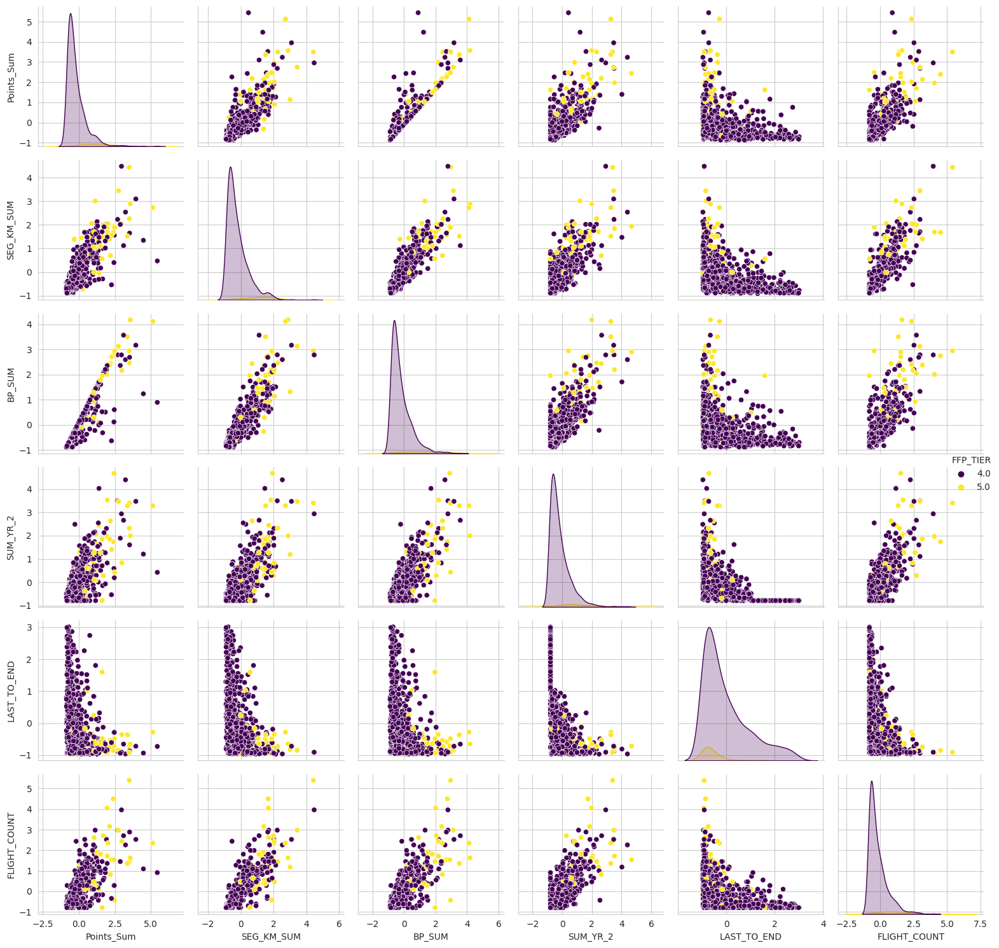

In [ ]:
# Pairplot dataset awal

z = new_df.copy()
z['FFP_TIER'] = y

q = z.sample(1000, random_state=0)

plt.figure(figsize=(15, 15))
sns.pairplot(q, diag_kind='kde', hue='FFP_TIER', palette='viridis')

plt.tight_layout()
plt.show()

<Figure size 1500x1500 with 0 Axes>

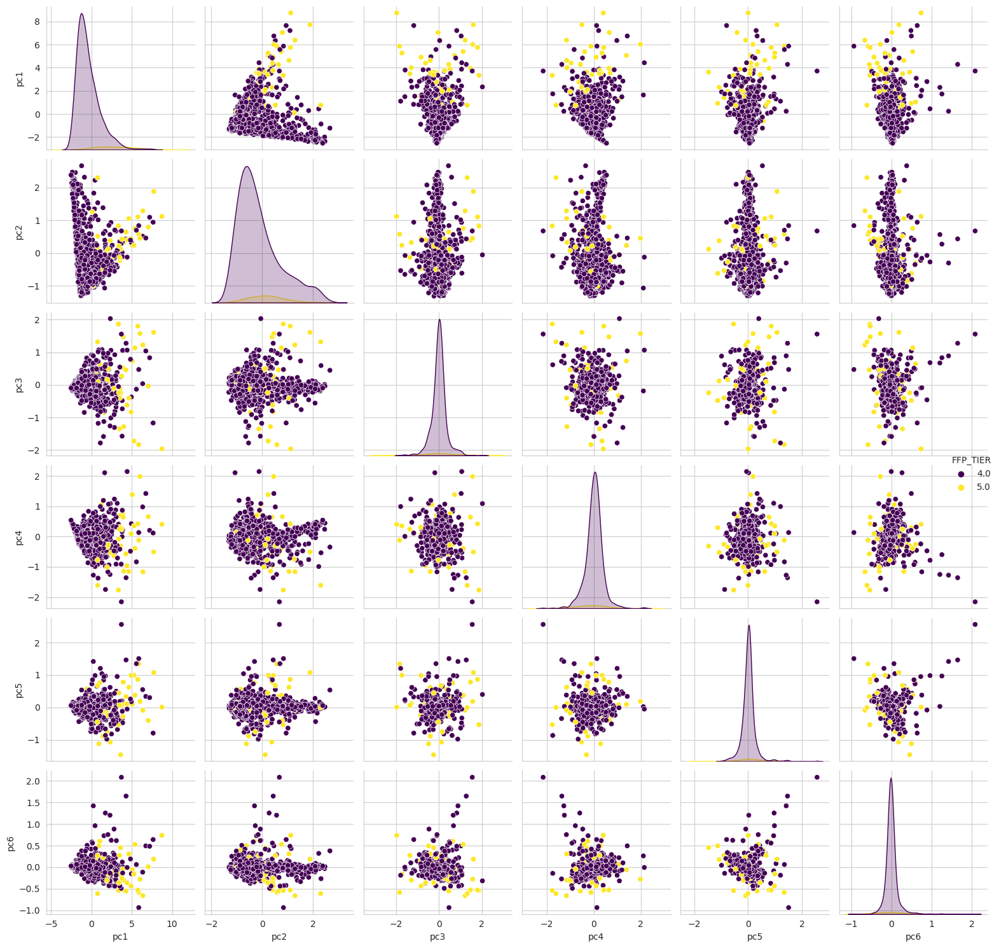

In [ ]:
# Pairplot dataset setelah PCA

z = df_pca.copy()
z['FFP_TIER'] = y

q = z.sample(1000, random_state=0)

plt.figure(figsize=(15, 15))
sns.pairplot(q, diag_kind='kde', hue='FFP_TIER', palette='viridis')

plt.tight_layout()
plt.show()

Berdasarkan hasil dari nilai PCA, feature pc3, pc4, pc5, dan pc6 dapat didrop karena tidak memberikan informasi yang penting.

Sehingga hanya digunakan 2 fitur saja.

## Klasifikasi

Menentukan jumlah cluster yang optimal dengan metode elbow

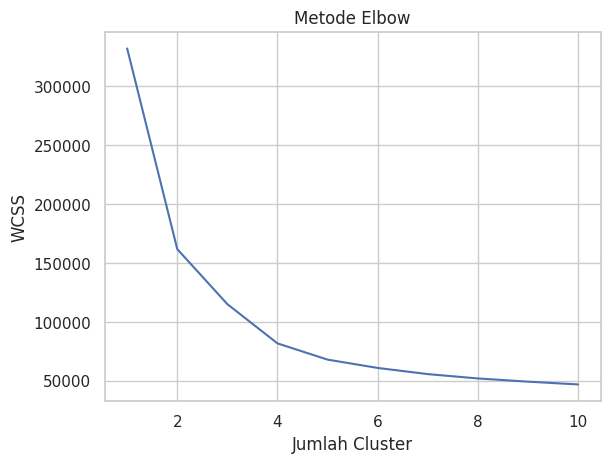

In [ ]:
# menentukan jumlah cluster optimal dengan metode elbow
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=50, random_state=42)
    kmeans.fit(x_scl)
    wcss.append(kmeans.inertia_)
    
# membuat plot menggunakan seaborn
sns.set(style='whitegrid')
sns.lineplot(x=range(1, 11), y=wcss)
plt.title('Metode Elbow')
plt.xlabel('Jumlah Cluster')
plt.ylabel('WCSS')
plt.show()

Menghitung silhouette score untuk mengevaluasi kualitas clustering

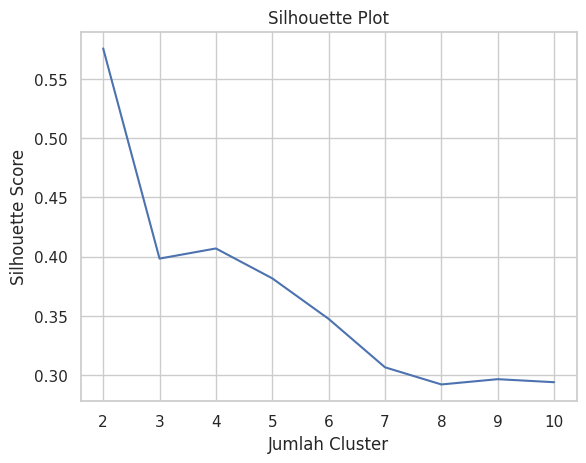

In [ ]:
# inisialisasi list untuk menyimpan nilai silhouette score
silhouette_scores = []

# hitung silhouette score untuk n_cluster dari 2 hingga 10
for n_cluster in range(2, 11):
    kmeans = KMeans(n_clusters=n_cluster, init='k-means++', n_init=50, random_state=42)
    kmeans.fit(x_scl)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(x_scl, labels)
    silhouette_scores.append(silhouette_avg)

# membuat plot menggunakan seaborn
sns.set(style='whitegrid')
sns.lineplot(x=range(2, 11), y=silhouette_scores)
plt.title('Silhouette Plot')
plt.xlabel('Jumlah Cluster')
plt.ylabel('Silhouette Score')
plt.show()

Melakukan clustering K-means dengan jumlah cluster yang optimal

In [ ]:
n_clusters = 2 # Ubah sesuai jumlah cluster yang dianggap optimal
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=50, random_state=42)
kmeans.fit(x_scl)

KMeans(n_clusters=2, n_init=50, random_state=42)

Menambahkan kolom hasil clustering ke dalam data frame

In [ ]:
x['cluster'] = kmeans.labels_
new_df['cluster'] = kmeans.labels_

In [ ]:
new_df.describe()

,Points_Sum,SEG_KM_SUM,BP_SUM,SUM_YR_2,LAST_TO_END,FLIGHT_COUNT,cluster
count,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,55359.000000
mean,3.285806e-17,-6.571612e-17,6.571612e-17,6.571612e-17,4.928709e-17,1.642903e-17,0.169728
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,0.375397
min,-8.664567e-01,-9.513358e-01,-8.851236e-01,-7.872438e-01,-9.687573e-01,-7.934102e-01,0.000000
25%,-6.355150e-01,-6.702500e-01,-6.442067e-01,-6.589055e-01,-8.040744e-01,-7.036336e-01,0.000000
50%,-3.550329e-01,-3.533370e-01,-3.578178e-01,-3.468783e-01,-3.649202e-01,-3.445272e-01,0.000000
75%,2.390402e-01,2.970197e-01,2.515353e-01,2.637651e-01,5.024094e-01,2.839090e-01,0.000000
max,8.603222e+00,6.670666e+00,7.791462e+00,7.147463e+00,3.038525e+00,6.478495e+00,1.000000


### K-means Cluster

Melakukan visualisasi hasil clustering dengan scatter plot

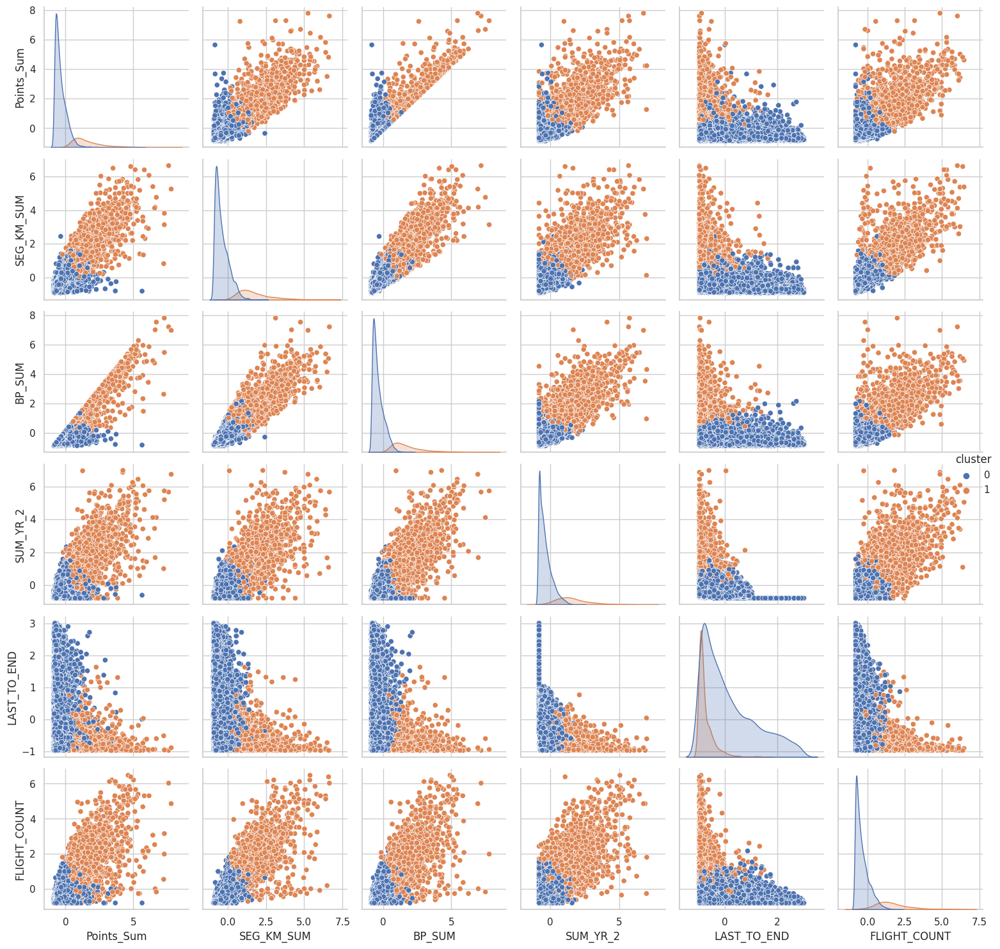

In [ ]:
# Pairplot dataset awal
# Use only 10,000 rows from new_df
sample_df = new_df.sample(n=10000, random_state=42)

sns.pairplot(sample_df, hue='cluster')

plt.tight_layout()
plt.show()

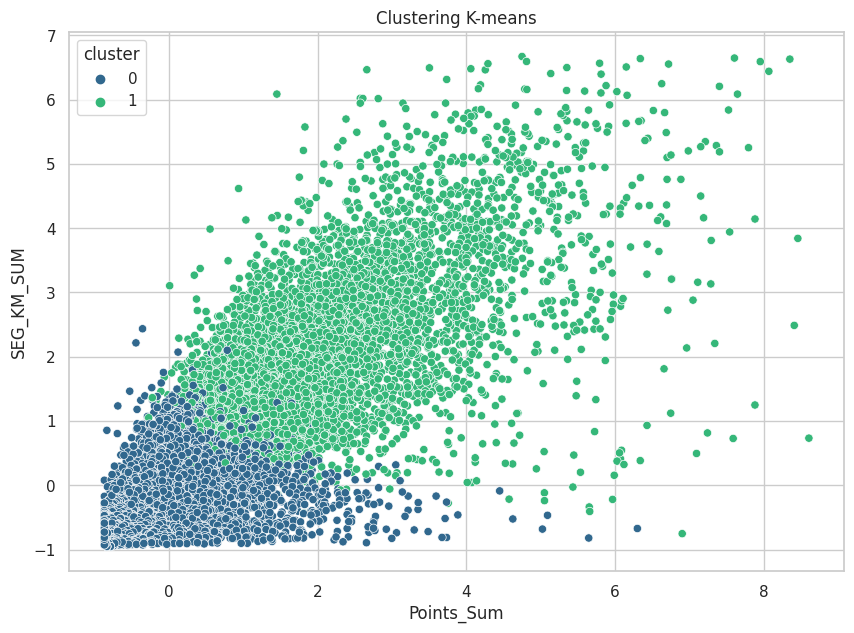

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=new_df.iloc[:, 0], y=new_df.iloc[:, 1], hue=new_df['cluster'], palette='viridis')
plt.xlabel('Points_Sum')
plt.ylabel('SEG_KM_SUM')
plt.title('Clustering K-means')
plt.show()

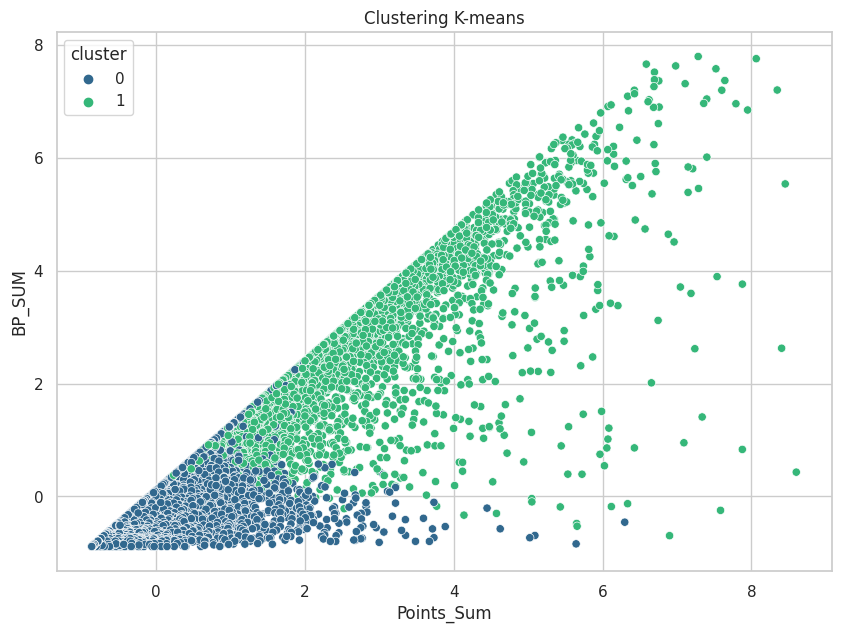

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=new_df.iloc[:, 0], y=new_df.iloc[:, 2], hue=new_df['cluster'], palette='viridis')
plt.xlabel('Points_Sum')
plt.ylabel('BP_SUM')
plt.title('Clustering K-means')
plt.show()

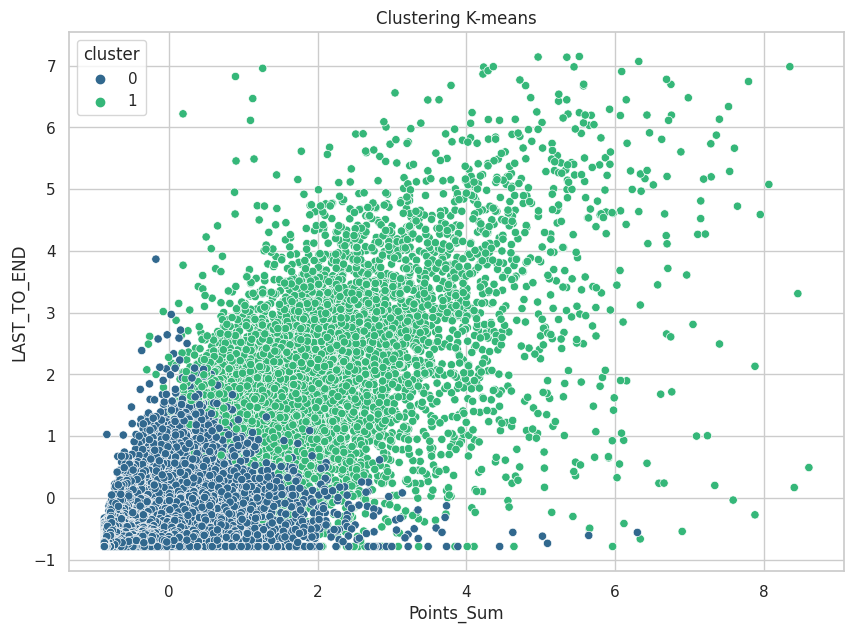

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=new_df.iloc[:, 0], y=new_df.iloc[:, 3], hue=new_df['cluster'], palette='viridis')
plt.xlabel('Points_Sum')
plt.ylabel('LAST_TO_END')
plt.title('Clustering K-means')
plt.show()

### PCA Cluster

In [ ]:
df_pca.describe()

,pc1,pc2,pc3,pc4,pc5,pc6
count,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04,5.535900e+04
mean,6.571612e-17,3.285806e-17,1.129496e-17,-8.214515e-18,-4.107258e-17,7.059349e-17
std,2.153784e+00,8.906645e-01,4.702910e-01,4.450519e-01,3.242243e-01,2.089870e-01
min,-2.536298e+00,-1.375345e+00,-3.988983e+00,-4.782013e+00,-3.667582e+00,-1.785917e+00
25%,-1.412476e+00,-6.821878e-01,-1.566691e-01,-1.820944e-01,-9.701338e-02,-7.175084e-02
50%,-6.845622e-01,-2.143134e-01,3.587574e-03,1.737543e-02,1.363593e-02,-1.759894e-02
75%,7.174736e-01,5.090953e-01,1.579230e-01,1.979289e-01,9.371635e-02,4.000767e-02
max,1.476475e+01,3.972349e+00,5.486848e+00,5.095332e+00,3.744416e+00,4.125220e+00


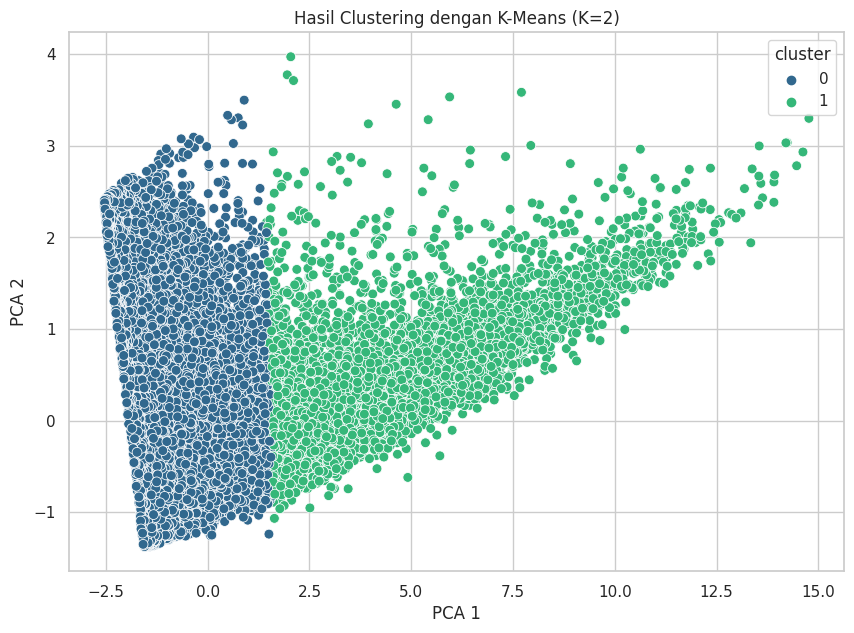

In [ ]:
# Melakukan PCA dengan 2 komponen
pca = PCA(n_components=2)
pca.fit(x_scl)
X_pca = pca.transform(x_scl)

# Plot hasil clustering dengan PCA
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=new_df['cluster'], palette='viridis', s=50)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Hasil Clustering dengan K-Means (K=2)')
plt.show()

# Bussines Recomendation

In [ ]:
df_clustered = x.copy()

cluster_stats = df_clustered.groupby('cluster').agg(['min', 'max', 'mean', 'std', 'median'])
cluster_stats = cluster_stats.round(3)
print(cluster_stats)

        Points_Sum                                        SEG_KM_SUM          \
               min     max       mean        std   median        min     max   
cluster                                                                        
0                0   87201   6341.018   5342.219   4846.0        368   54252   
1             6946  115264  31118.282  14953.270  26762.0       3549  121632   

                                        ... LAST_TO_END                \
              mean        std   median  ...         min  max     mean   
cluster                                 ...                             
0         9825.161   7085.469   7817.0  ...           1  731  204.704   
1        43280.564  17789.905  38969.0  ...           1  667   44.286   

                        FLIGHT_COUNT                             
             std median          min max    mean     std median  
cluster                                                          
0        186.802  144.0            

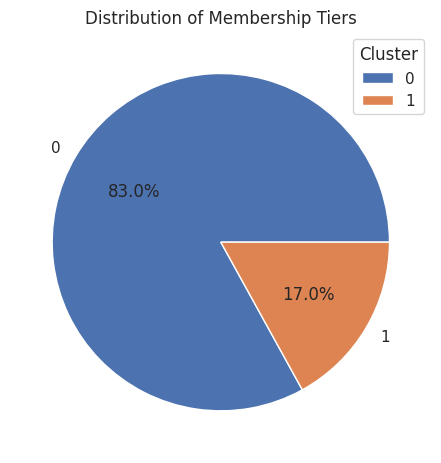

In [ ]:
tier_counts = df_clustered['cluster'].value_counts()

plt.pie(tier_counts, labels=tier_counts.index, autopct='%1.1f%%')
plt.title("Distribution of Membership Tiers")
plt.legend(title="Cluster", loc="best")
plt.tight_layout()
plt.show()

Deskripsi Customers:

Berdasarkan deskripsi data pada setiap cluster, kita dapat mengetahui beberapa informasi penting terkait perilaku pelanggan yang tergabung dalam masing-masing cluster.

Pada Cluster 0, pelanggan cenderung memiliki jumlah poin yang lebih rendah, melakukan perjalanan dengan jarak yang lebih pendek, dan mengeluarkan biaya yang lebih sedikit pada rencana perjalanan. Namun, mereka cenderung melakukan lebih banyak penerbangan dan jarak waktu antara penerbangan terakhir dan pesanan penerbangan paling akhir lebih panjang.

Sementara itu, pada Cluster 1, pelanggan cenderung memiliki jumlah poin yang lebih tinggi, melakukan perjalanan dengan jarak yang lebih jauh, dan mengeluarkan biaya yang lebih besar pada rencana perjalanan. Namun, mereka cenderung melakukan lebih sedikit penerbangan dan jarak waktu antara penerbangan terakhir dan pesanan penerbangan paling akhir lebih pendek.

Rekomendasi bisnis di setiap cluster:

Berdasarkan hasil cluster yang didapat, dapat diberikan beberapa rekomendasi bisnis sebagai berikut:

Cluster 0:
Pelanggan dalam cluster ini cenderung memiliki poin yang lebih sedikit dan melakukan perjalanan jarak dekat. Rekomendasi bisnis yang dapat dilakukan adalah menawarkan program penghargaan atau diskon yang didasarkan pada poin yang dikumpulkan yang menargetkan pelanggan yang melakukan perjalanan jarak dekat. Selain itu, maskapai penerbangan dapat mempertimbangkan menawarkan penawaran khusus untuk pelanggan dengan biaya perjalanan yang lebih rendah, untuk meningkatkan keterlibatan pelanggan.

Cluster 1:
Pelanggan dalam cluster ini cenderung melakukan perjalanan jarak jauh dan mengeluarkan biaya yang lebih tinggi untuk rencana perjalanan mereka. Rekomendasi bisnis yang dapat dilakukan adalah menawarkan layanan khusus atau penawaran diskon untuk pelanggan yang melakukan perjalanan jarak jauh atau mengeluarkan biaya yang lebih tinggi. Maskapai penerbangan juga dapat mempertimbangkan program pemasaran khusus untuk meningkatkan keterlibatan pelanggan yang sering melakukan perjalanan jarak jauh dan mengeluarkan biaya yang lebih tinggi.